In [45]:
"""
Training a Classifier
=====================

----------------
Generally, when you have to deal with image, text, audio or video data,
you can use standard python packages that load data into a numpy array.
Then you can convert this array into a ``torch.*Tensor``.
-  For images, packages such as Pillow, OpenCV are useful
-  For audio, packages such as scipy and librosa
-  For text, either raw Python or Cython based loading, or NLTK and
   SpaCy are useful
Specifically for vision, we have created a package called
``torchvision``, that has data loaders for common datasets such as
Imagenet, CIFAR10, MNIST, etc. and data transformers for images, viz.,
``torchvision.datasets`` and ``torch.utils.data.DataLoader``.

This provides a huge convenience and avoids writing boilerplate code.
For this tutorial, we will use the CIFAR10 dataset.

It has the classes: ‘airplane’, ‘automobile’, ‘bird’, ‘cat’, ‘deer’,
‘dog’, ‘frog’, ‘horse’, ‘ship’, ‘truck’. 

The images in CIFAR-10 are of
size 3x32x32, i.e. 3-channel color images of 32x32 pixels in size.
.. figure:: /_static/img/cifar10.png
   :alt: cifar10
   cifar10
Training an image classifier
----------------------------
We will do the following steps in order:
1. Load and normalizing the CIFAR10 training and test datasets using
   ``torchvision``
2. Define a Convolutional Neural Network
3. Define a loss function
4. Train the network on the training data
5. Test the network on the test data
1. Loading and normalizing CIFAR10
^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
Using ``torchvision``, it’s extremely easy to load CIFAR10.
"""
import torch
import torchvision
import torchvision.transforms as transforms

########################################################################
# The output of torchvision datasets are PILImage images of range [0, 1].
# We transform them to Tensors of normalized range [-1, 1].

# .. note::

#     If running on Windows and you get a BrokenPipeError, try setting
#     the num_worker of torch.utils.data.DataLoader() to 0.

transform = transforms.Compose(
    [transforms.ToTensor(),
     transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))])

trainset = torchvision.datasets.CIFAR10(root='./data', train=True,
                                        download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=4,
                                          shuffle=True, num_workers=0)

testset = torchvision.datasets.CIFAR10(root='./data', train=False,
                                       download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=4,
                                         shuffle=False, num_workers=0)

classes = ('plane', 'car', 'bird', 'cat',
           'deer', 'dog', 'frog', 'horse', 'ship', 'truck')


Files already downloaded and verified
Files already downloaded and verified


In [44]:
%reset

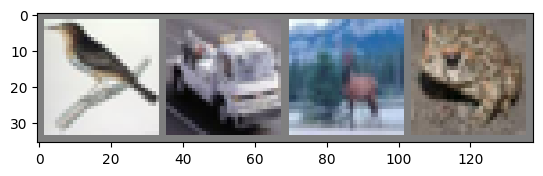

 bird truck  deer  frog


In [46]:
import matplotlib.pyplot as plt
import numpy as np

# functions to show an image


def imshow(img):
    img = img / 2 + 0.5     # unnormalize
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show()


## get some random training images
#dataiter = iter(trainloader)
#images, labels = dataiter.next()

for images, labels in trainloader:
    # show images
    imshow(torchvision.utils.make_grid(images))
    # print labels
    print(' '.join('%5s' % classes[labels[j]] for j in range(4)))
    break  # Pour afficher seulement un lot d'images


In [52]:
########################################################################
# 2. Define a Convolutional Neural Network
# ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
# Copy the neural network from the Neural Networks section before and modify it to
# take 3-channel images (instead of 1-channel images as it was defined).

import torch.nn as nn
import torch.nn.functional as F


class Net(nn.Module):
    def __init__(self):
        super(Net, self).__init__()
        self.conv1 = nn.Conv2d(3, 10, 5)
        
        self.pool = nn.MaxPool2d(2, 2)
        
        self.conv2 = nn.Conv2d(10, 10, 5)
    
        self.fc1 = nn.Linear(10 * 5 * 5, 128)
        self.fc2 = nn.Linear(128, 84)
        self.fc3 = nn.Linear(84, 10)
        

    def forward(self, x):
        x = self.pool(F.relu(self.conv1(x)))
        x = self.pool(F.relu(self.conv2(x)))
        x = x.view(-1, 10 * 5 * 5)
        x = F.relu(self.fc1(x))
        x = F.relu(self.fc2(x))
        x = self.fc3(x)
       
        return x


net = Net()


In [53]:
# 3. Define a Loss function and optimizer
# ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
# use a Classification Cross-Entropy loss and SGD with momentum.

import torch.optim as optim

criterion = nn.CrossEntropyLoss()
optimizer = optim.SGD(net.parameters(), lr=0.001, momentum=0.9)


In [54]:
########################################################################
# 4. Train the network
# ^^^^^^^^^^^^^^^^^^^^
#
#  loop over our data iterator, and feed the inputs to the
# network and optimize.

for epoch in range(2):  # loop over the dataset multiple times

    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        # get the inputs; data is a list of [inputs, labels]
        inputs, labels = data

        # zero the parameter gradients
        optimizer.zero_grad()

        # forward + backward + optimize
        outputs = net(inputs)
        loss = criterion(outputs, labels)
        loss.backward()
        optimizer.step()

        # print statistics
        running_loss += loss.item()
        if i % 2000 == 1999:    # print every 2000 mini-batches
            print('[%d, %5d] loss: %.3f' %
                  (epoch + 1, i + 1, running_loss / 2000))
            running_loss = 0.0

print('Finished Training')

[1,  2000] loss: 2.156
[1,  4000] loss: 1.804
[1,  6000] loss: 1.629
[1,  8000] loss: 1.538
[1, 10000] loss: 1.490
[1, 12000] loss: 1.451
[2,  2000] loss: 1.381
[2,  4000] loss: 1.371
[2,  6000] loss: 1.333
[2,  8000] loss: 1.323
[2, 10000] loss: 1.288
[2, 12000] loss: 1.267
Finished Training


In [55]:
#  save our trained model:

PATH = './cifar_net.pth'
torch.save(net.state_dict(), PATH)

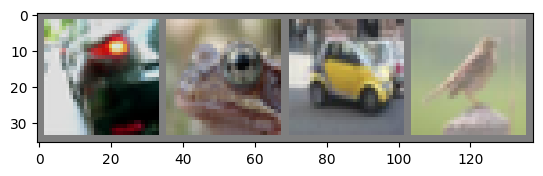

GroundTruth:    car  frog   car  bird


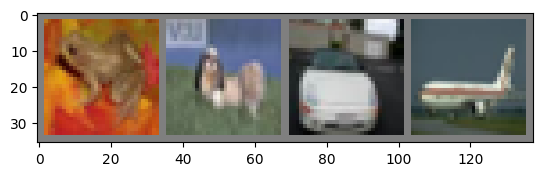

GroundTruth:   frog   dog   car plane


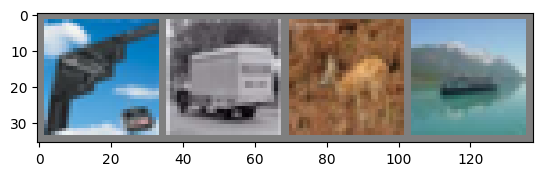

GroundTruth:  plane truck  deer  ship


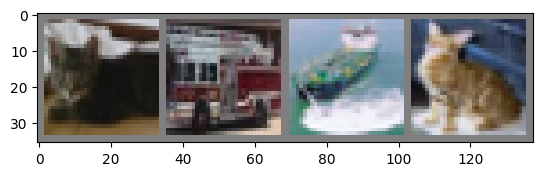

GroundTruth:    cat truck  ship   cat


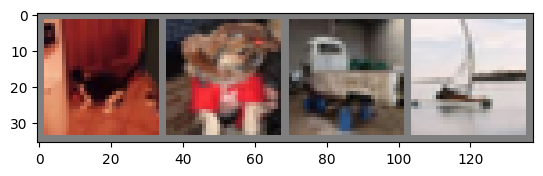

GroundTruth:    cat   dog truck  ship


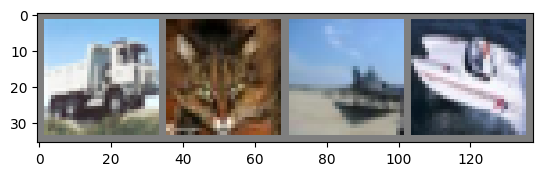

GroundTruth:  truck   cat plane  ship


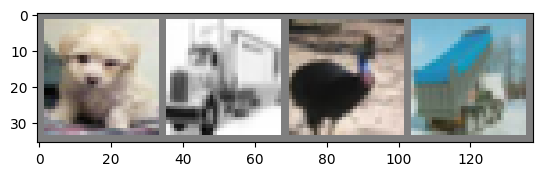

GroundTruth:    dog truck  bird truck


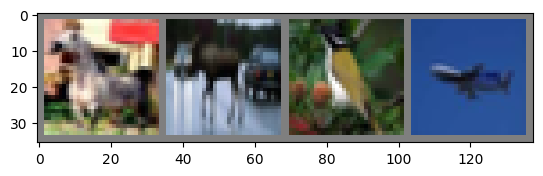

GroundTruth:  horse  deer  bird plane


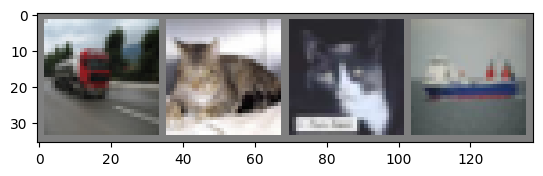

GroundTruth:  truck   cat   cat  ship


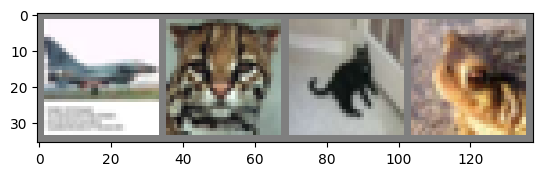

GroundTruth:  plane   cat   cat  frog


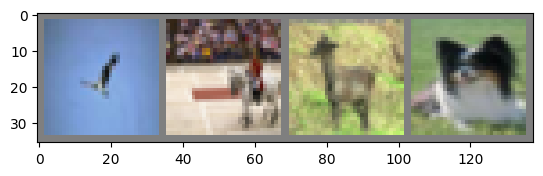

GroundTruth:   bird horse  deer   dog


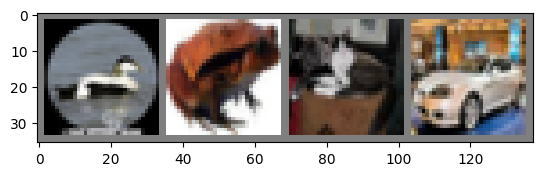

GroundTruth:   bird  frog   cat   car


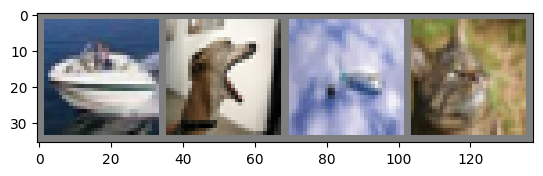

GroundTruth:   ship   dog plane   cat


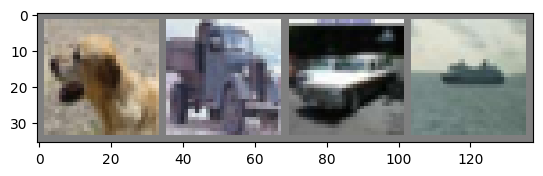

GroundTruth:    dog truck   car  ship


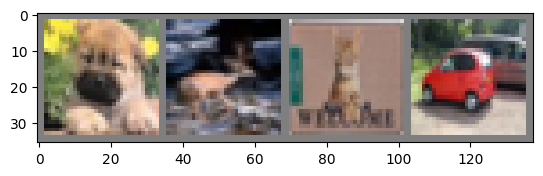

GroundTruth:    dog  deer   cat   car


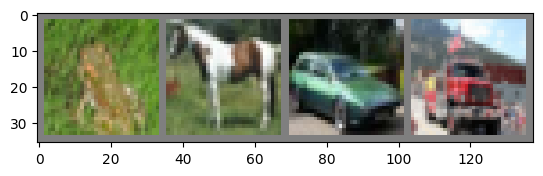

GroundTruth:   frog horse   car truck


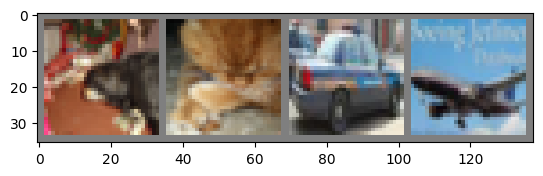

GroundTruth:    dog   cat   car plane


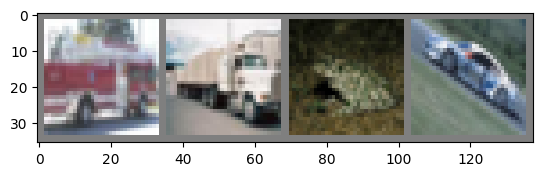

GroundTruth:  truck truck  frog   car


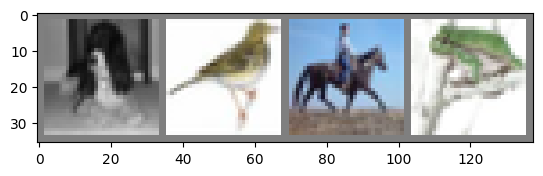

GroundTruth:    dog  bird horse  frog


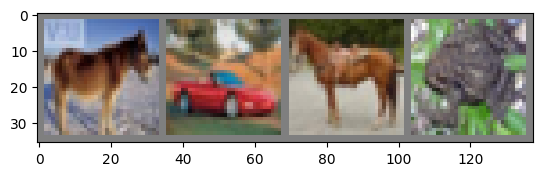

GroundTruth:  horse   car horse  frog


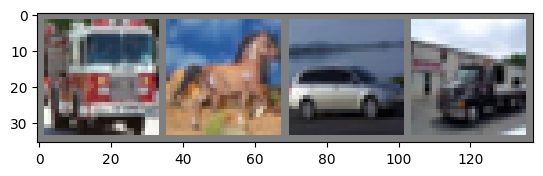

GroundTruth:  truck horse   car truck


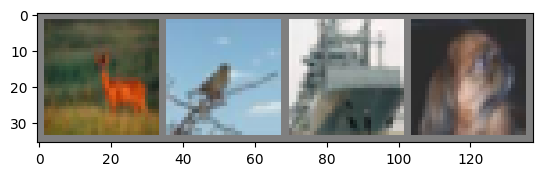

GroundTruth:   deer  bird  ship   dog


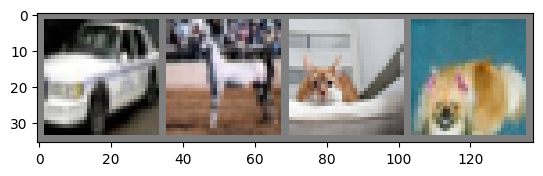

GroundTruth:    car horse   cat   dog


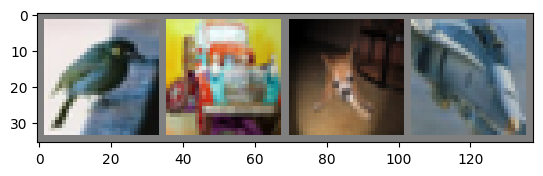

GroundTruth:   bird truck   dog plane


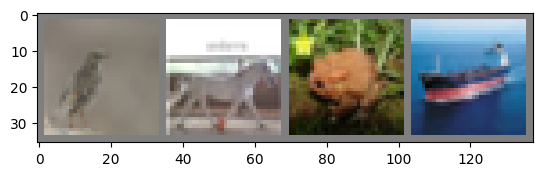

GroundTruth:   bird horse  frog  ship


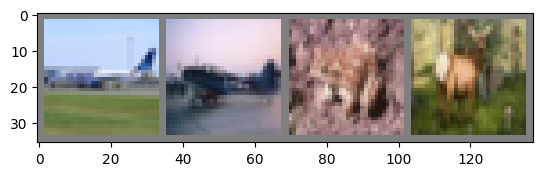

GroundTruth:  plane plane  frog  deer


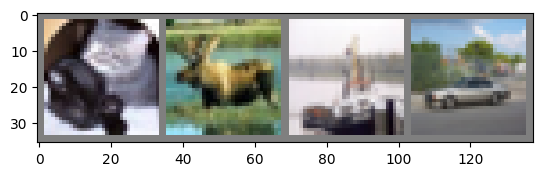

GroundTruth:    cat  deer  ship   car


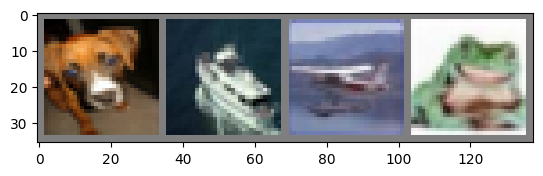

GroundTruth:    dog  ship plane  frog


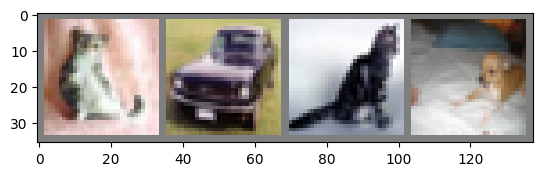

GroundTruth:    cat   car   cat   dog


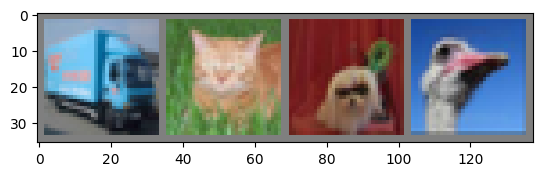

GroundTruth:  truck   cat   dog  bird


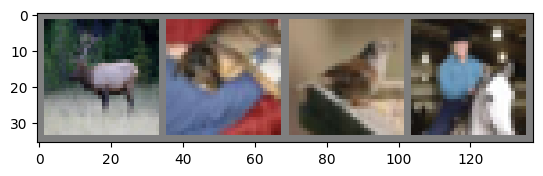

GroundTruth:   deer   dog  bird horse


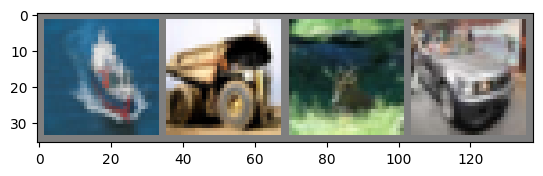

GroundTruth:   ship truck  deer   car


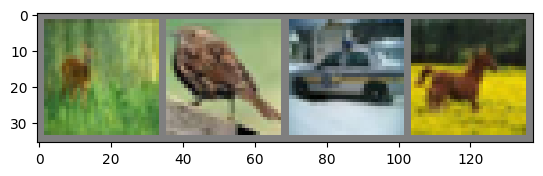

GroundTruth:   deer  bird   car horse


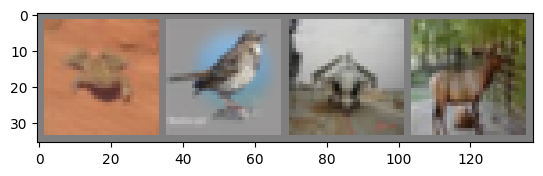

GroundTruth:   frog  bird plane  deer


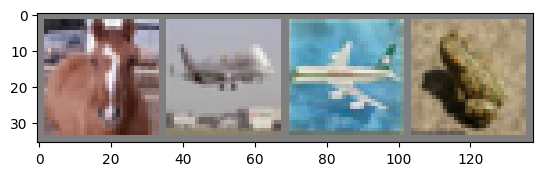

GroundTruth:  horse plane plane  frog


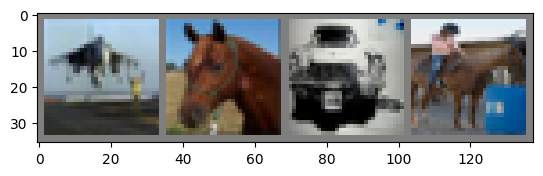

GroundTruth:  plane horse   car horse


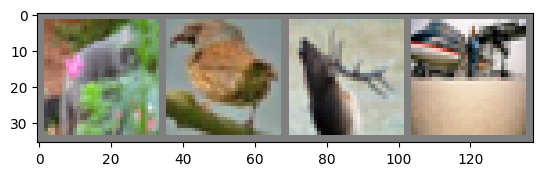

GroundTruth:    cat  bird  deer plane


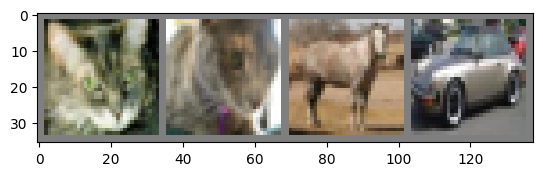

GroundTruth:    cat   cat horse   car


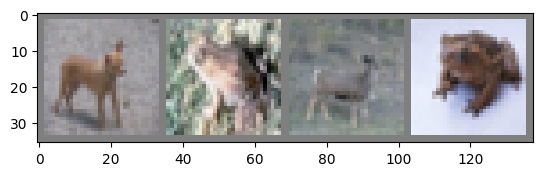

GroundTruth:    dog  frog  deer  frog


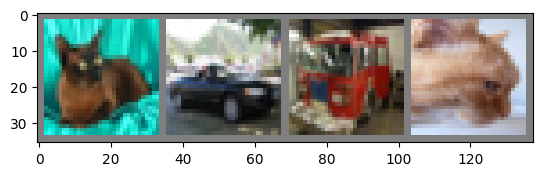

GroundTruth:    cat   car truck   cat


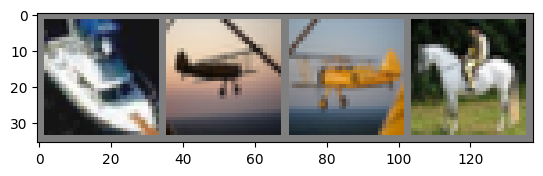

GroundTruth:   ship plane plane horse


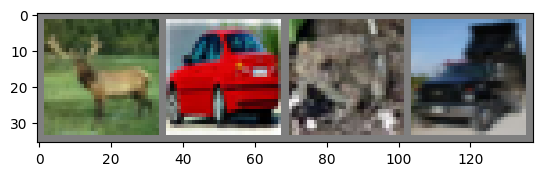

GroundTruth:   deer   car  frog truck


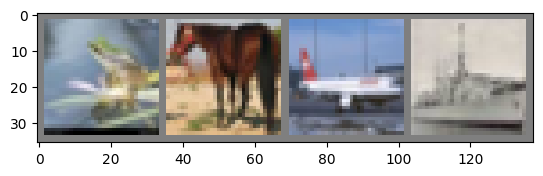

GroundTruth:   frog horse plane  ship


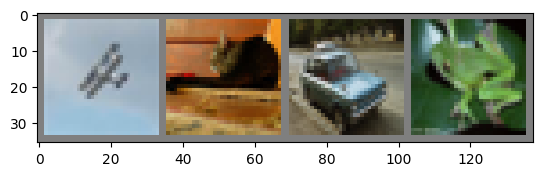

GroundTruth:  plane   cat   car  frog


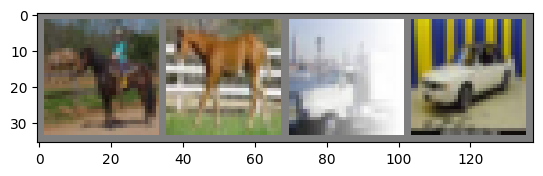

GroundTruth:  horse horse truck   car


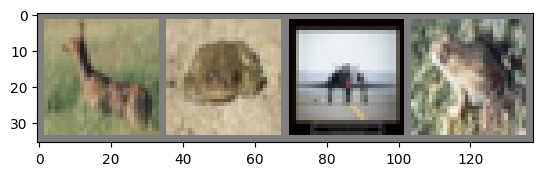

GroundTruth:   deer  frog plane  frog


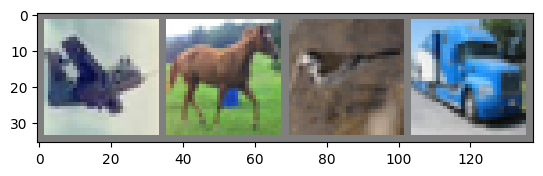

GroundTruth:  plane horse  bird truck


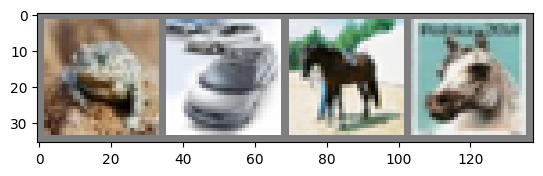

GroundTruth:   frog   car horse horse


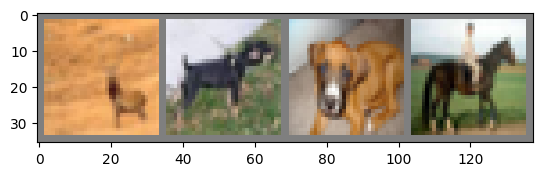

GroundTruth:   deer   dog   dog horse


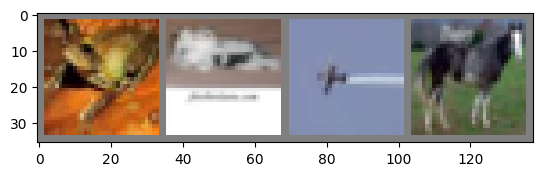

GroundTruth:   frog   cat plane horse


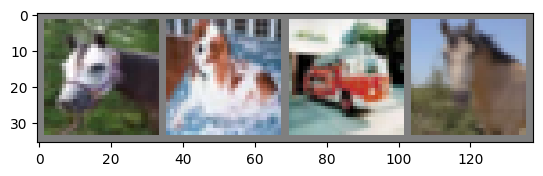

GroundTruth:  horse   dog truck horse


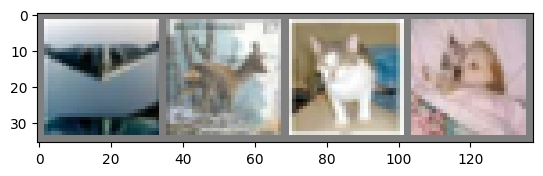

GroundTruth:  plane  deer   cat   cat


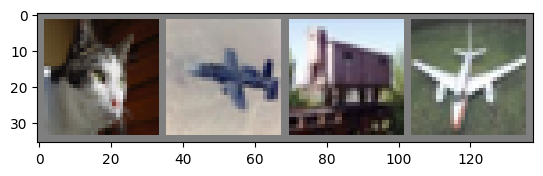

GroundTruth:    cat plane truck plane


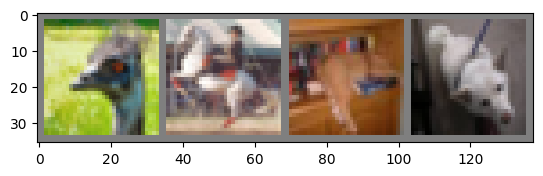

GroundTruth:   bird horse   cat   dog


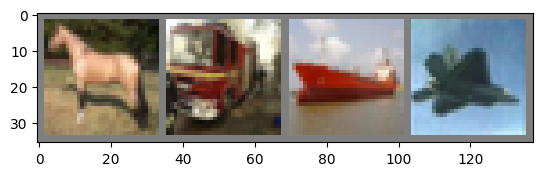

GroundTruth:  horse truck  ship plane


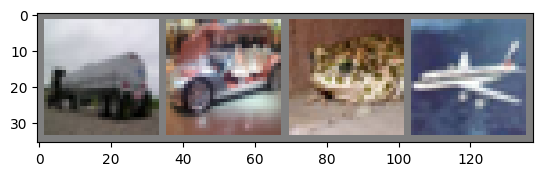

GroundTruth:  truck   car  frog plane


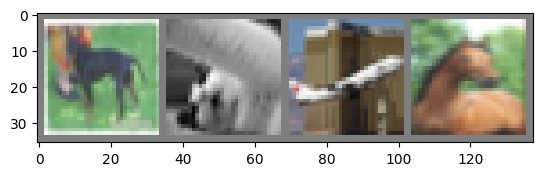

GroundTruth:    dog   cat plane horse


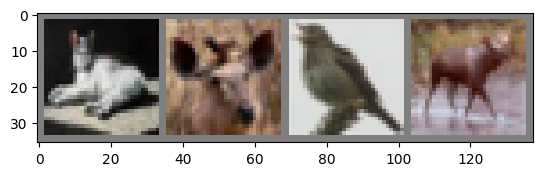

GroundTruth:    cat  deer  bird  deer


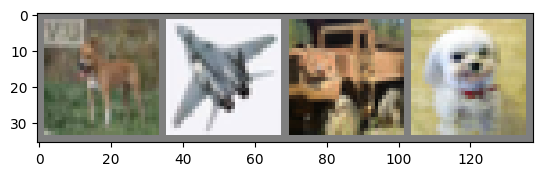

GroundTruth:    dog plane truck   dog


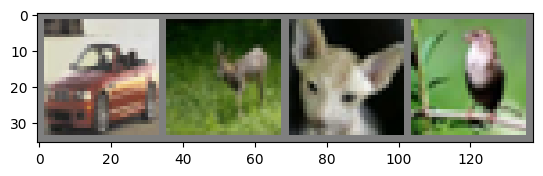

GroundTruth:    car  deer   cat  bird


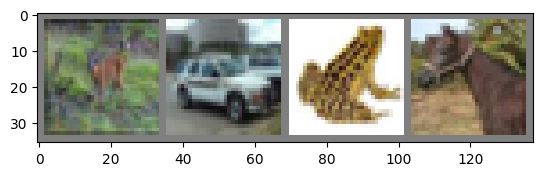

GroundTruth:   deer   car  frog horse


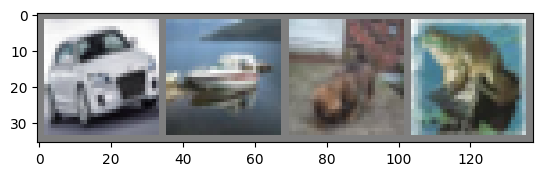

GroundTruth:    car  ship   dog  frog


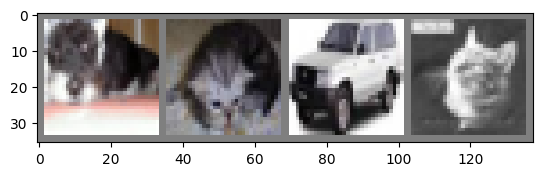

GroundTruth:    dog   cat   car   cat


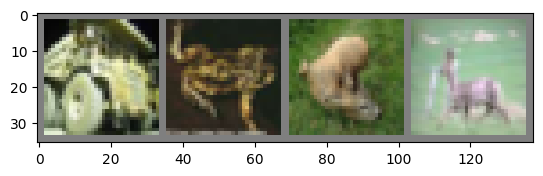

GroundTruth:  truck  frog  deer  deer


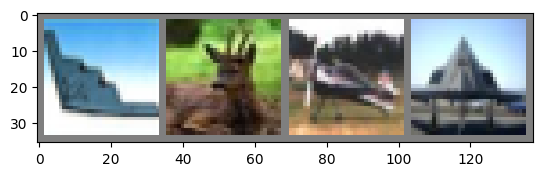

GroundTruth:  plane  deer plane plane


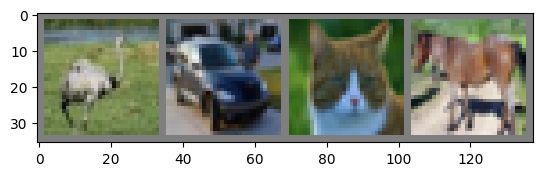

GroundTruth:   bird   car   cat horse


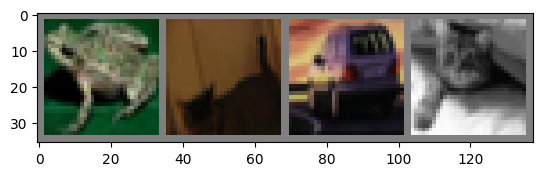

GroundTruth:   frog   cat   car   cat


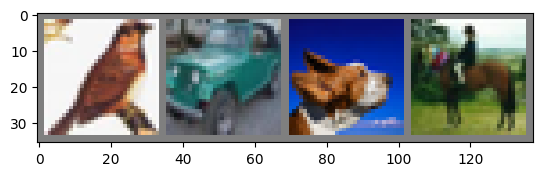

GroundTruth:   bird   car   dog horse


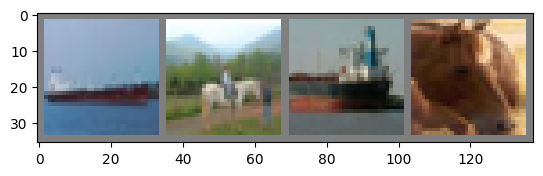

GroundTruth:   ship horse  ship horse


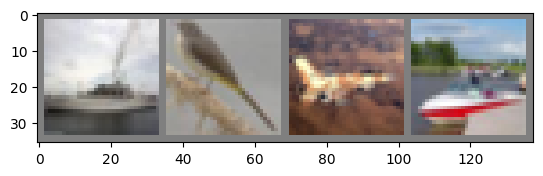

GroundTruth:   ship  bird plane  ship


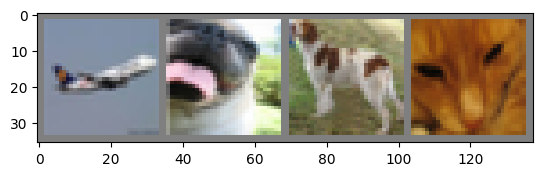

GroundTruth:  plane   dog   dog   cat


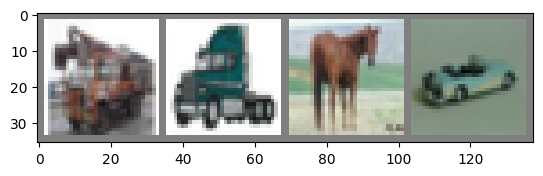

GroundTruth:  truck truck horse   car


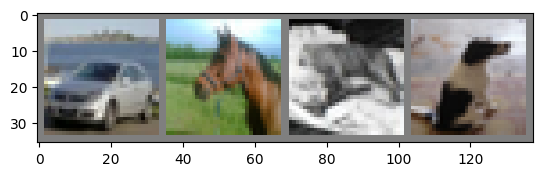

GroundTruth:    car horse   cat   dog


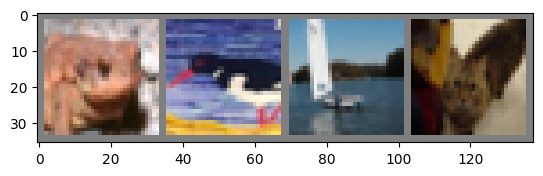

GroundTruth:   frog  bird  ship   cat


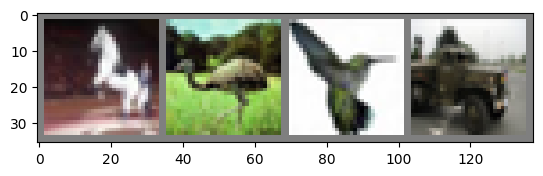

GroundTruth:  horse  bird  bird truck


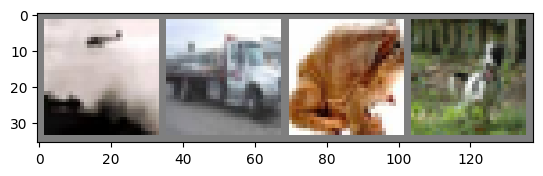

GroundTruth:  plane truck  frog   dog


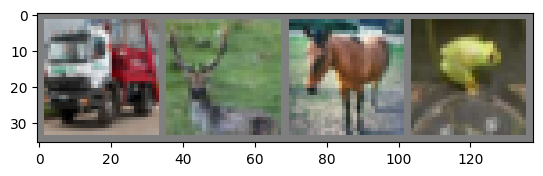

GroundTruth:  truck  deer horse  frog


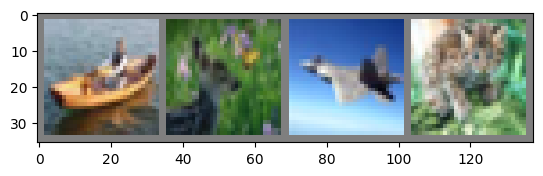

GroundTruth:   ship  deer plane   cat


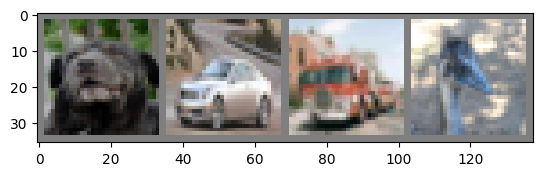

GroundTruth:    dog   car truck  bird


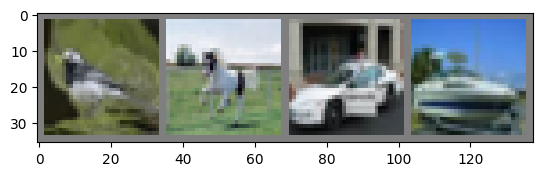

GroundTruth:   bird horse   car  ship


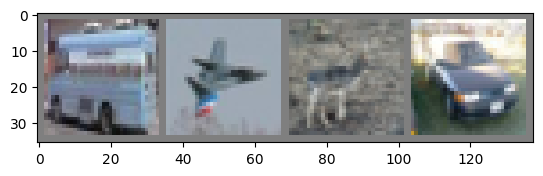

GroundTruth:  truck plane  deer   car


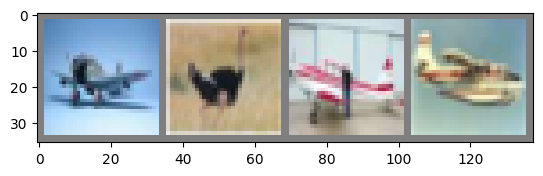

GroundTruth:  plane  bird plane plane


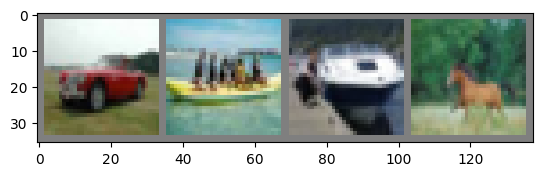

GroundTruth:    car  ship  ship horse


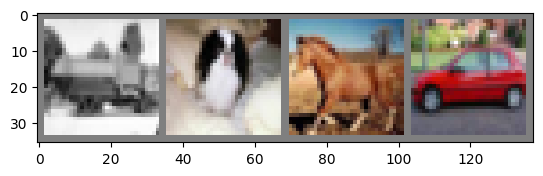

GroundTruth:  truck   dog horse   car


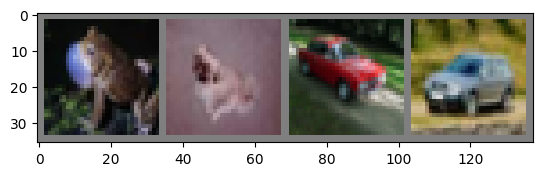

GroundTruth:   frog   dog   car   car


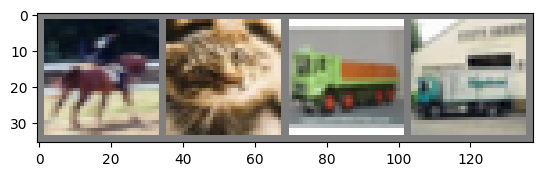

GroundTruth:  horse   cat truck truck


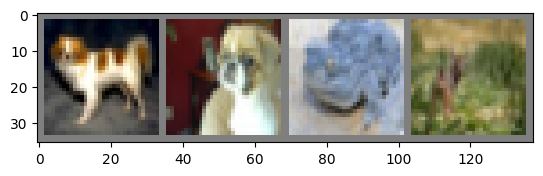

GroundTruth:    dog   dog  frog  deer


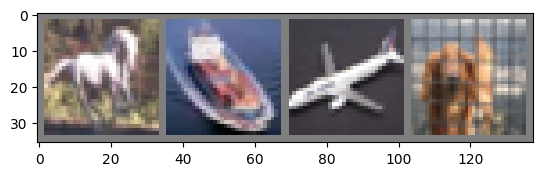

GroundTruth:  horse  ship plane   dog


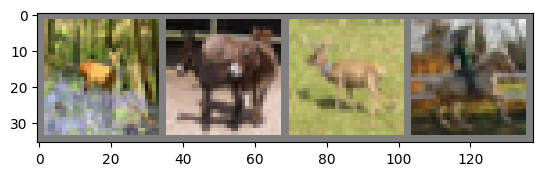

GroundTruth:   deer  deer  deer horse


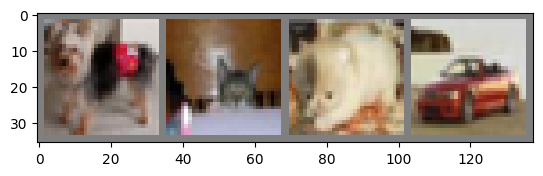

GroundTruth:    dog   cat   cat   car


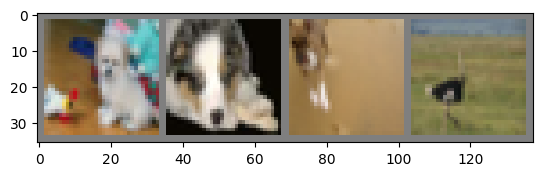

GroundTruth:    dog   dog   dog  bird


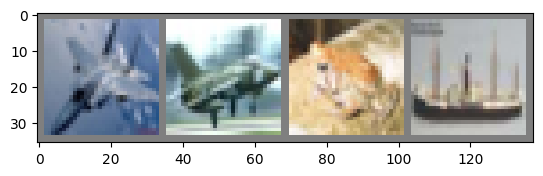

GroundTruth:  plane plane  frog  ship


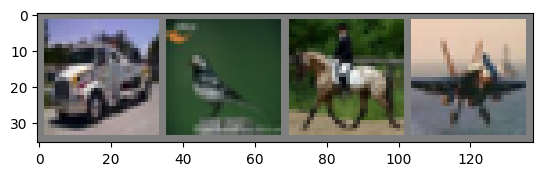

GroundTruth:  truck  bird horse plane


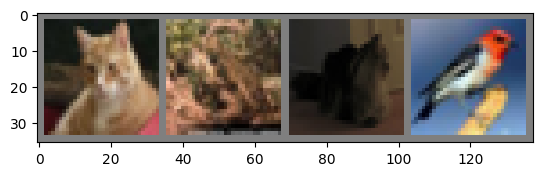

GroundTruth:    cat  frog   cat  bird


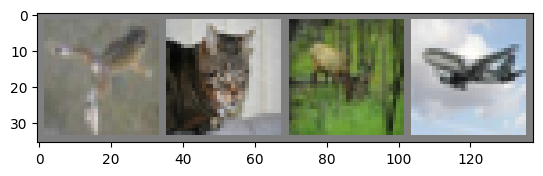

GroundTruth:   frog   cat  deer plane


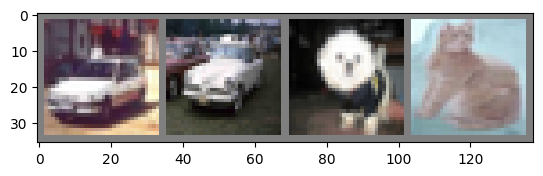

GroundTruth:    car   car   dog   cat


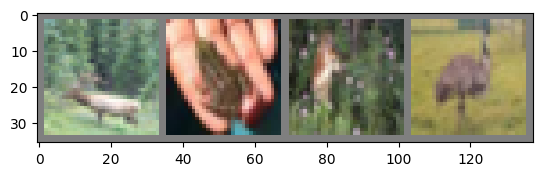

GroundTruth:   deer  frog  deer  bird


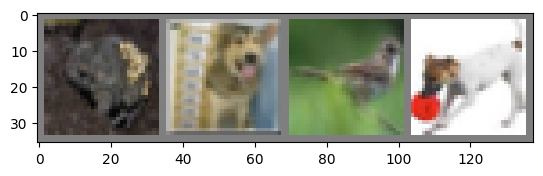

GroundTruth:   frog   dog  bird   dog


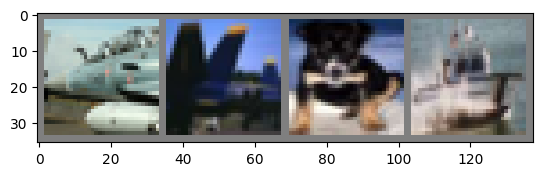

GroundTruth:  plane plane   dog  ship


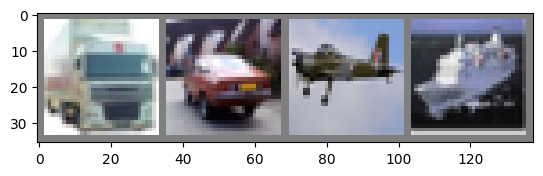

GroundTruth:  truck   car plane  ship


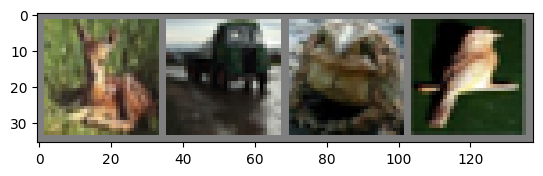

GroundTruth:   deer truck  frog  bird


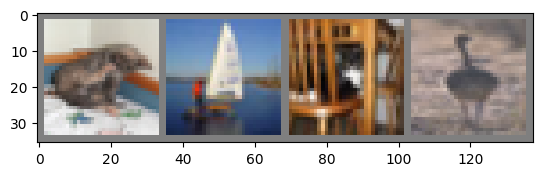

GroundTruth:    cat  ship   cat  bird


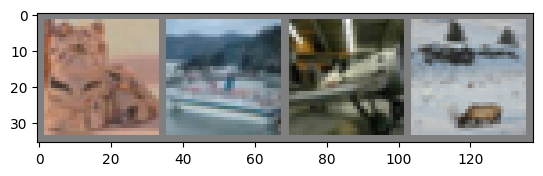

GroundTruth:    cat  ship plane  deer


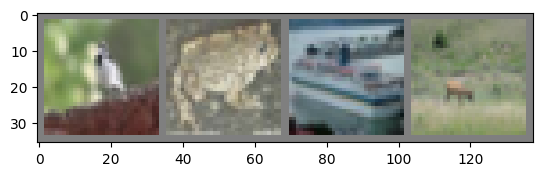

GroundTruth:   bird  frog  ship  deer


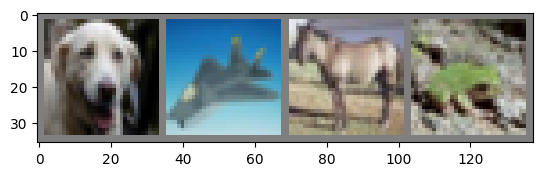

GroundTruth:    dog plane horse  frog


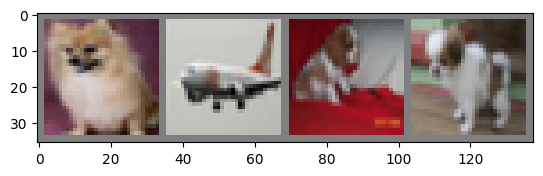

GroundTruth:    dog plane   dog   dog


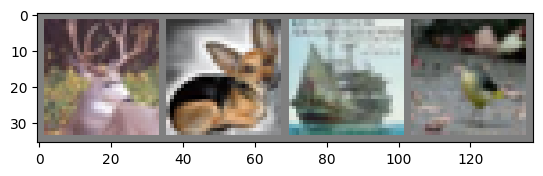

GroundTruth:   deer   dog  ship  bird


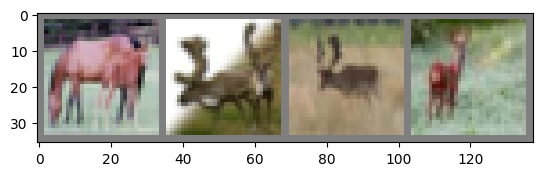

GroundTruth:  horse  deer  deer  deer


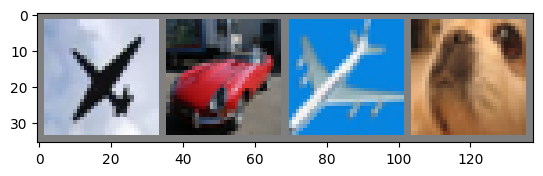

GroundTruth:  plane   car plane   dog


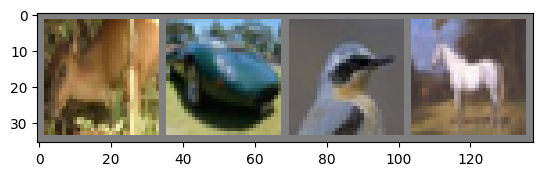

GroundTruth:   deer   car  bird horse


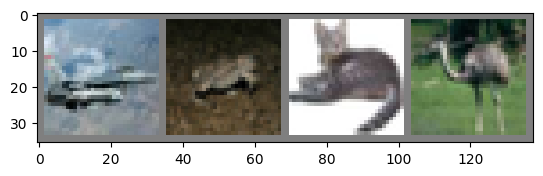

GroundTruth:  plane  frog   cat  bird


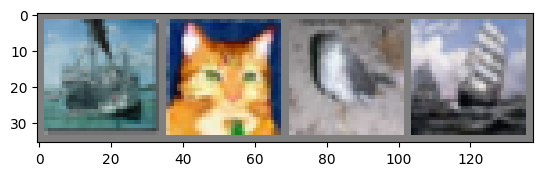

GroundTruth:   ship   cat  bird  ship


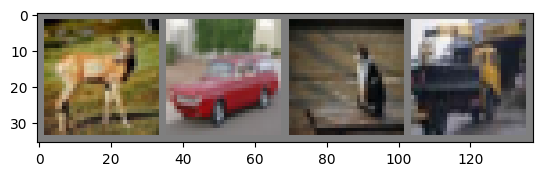

GroundTruth:   deer   car   cat truck


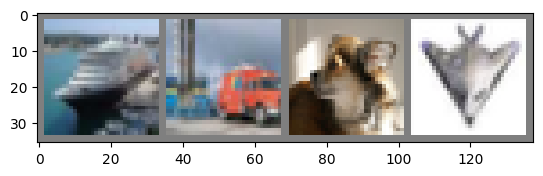

GroundTruth:   ship truck   dog plane


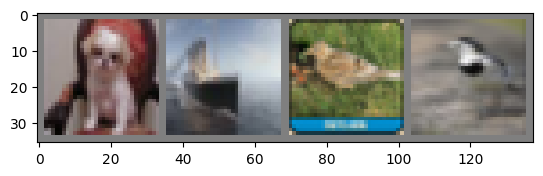

GroundTruth:    dog  ship  bird  bird


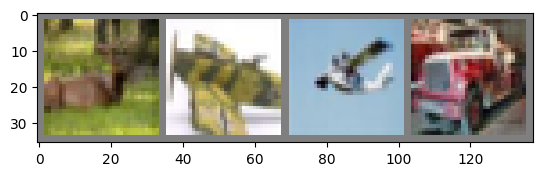

GroundTruth:   deer plane plane truck


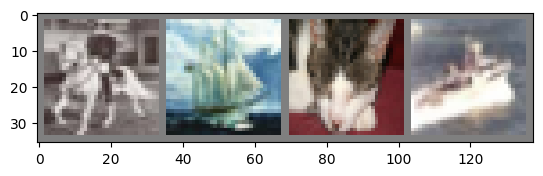

GroundTruth:  horse  ship   cat  ship


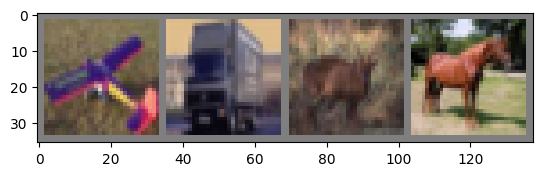

GroundTruth:  plane truck  deer horse


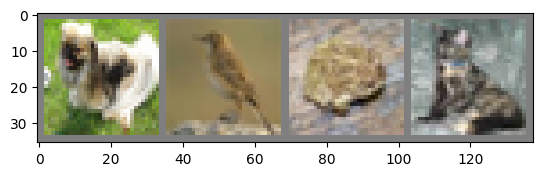

GroundTruth:    dog  bird  frog   cat


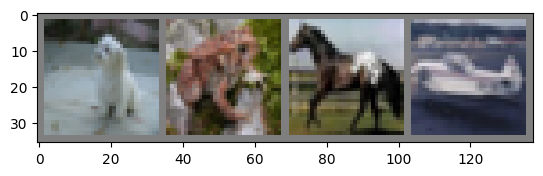

GroundTruth:    dog  frog horse plane


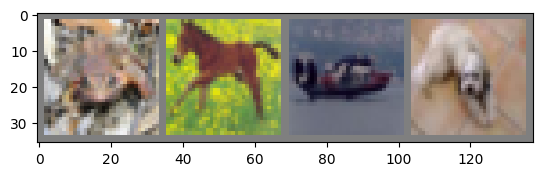

GroundTruth:   frog horse plane   dog


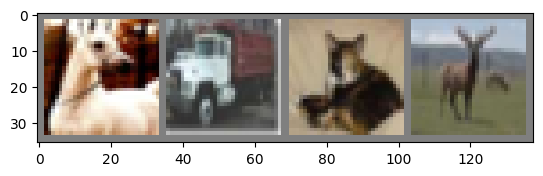

GroundTruth:  horse truck   cat  deer


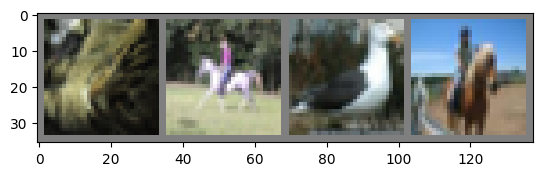

GroundTruth:    cat horse  bird horse


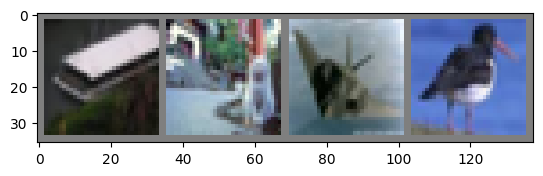

GroundTruth:   ship   cat plane  bird


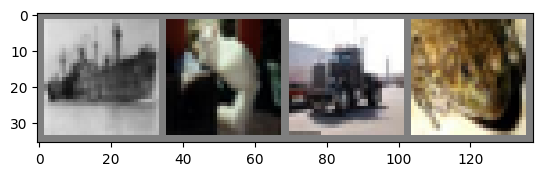

GroundTruth:   ship   cat truck  frog


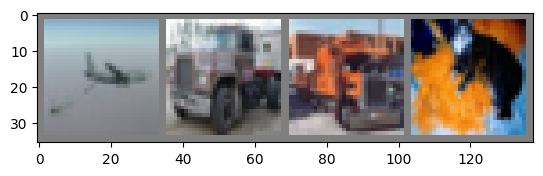

GroundTruth:  plane truck truck   cat


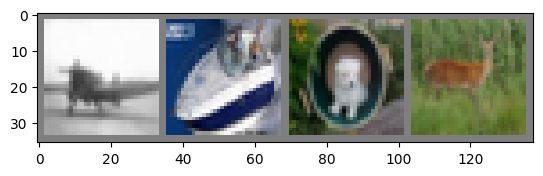

GroundTruth:  plane  ship   dog  deer


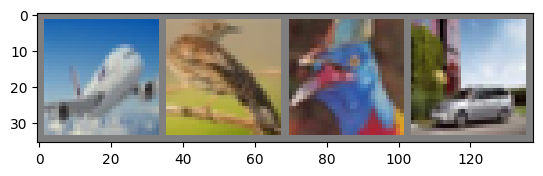

GroundTruth:  plane  bird  bird   car


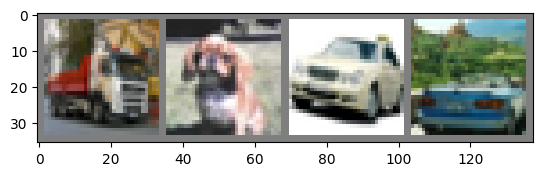

GroundTruth:  truck   dog   car   car


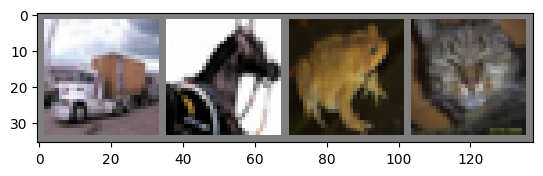

GroundTruth:  truck horse  frog   cat


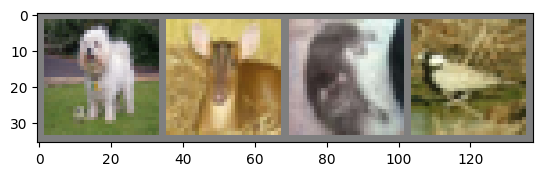

GroundTruth:    dog  deer   cat  bird


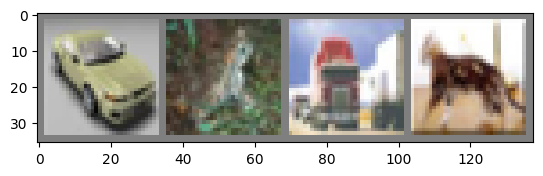

GroundTruth:    car  frog truck   cat


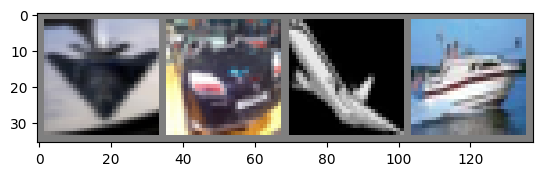

GroundTruth:  plane   car plane  ship


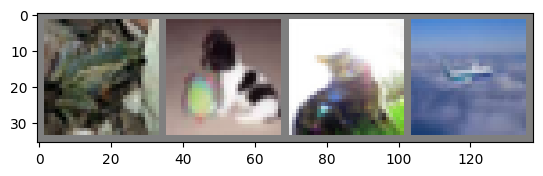

GroundTruth:   frog   dog   cat plane


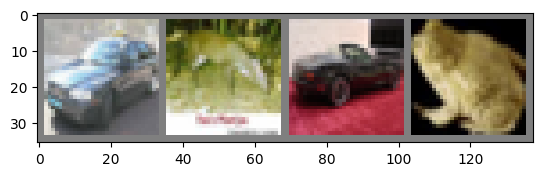

GroundTruth:    car  deer   car  frog


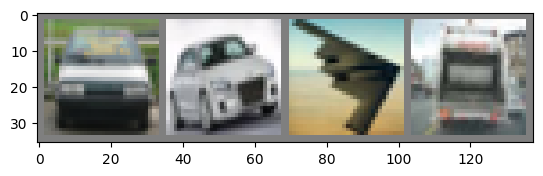

GroundTruth:    car   car plane truck


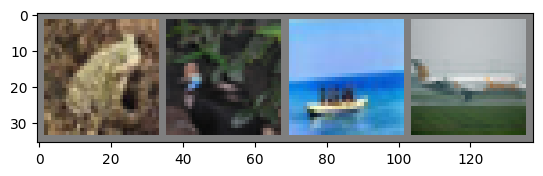

GroundTruth:   frog  bird  ship plane


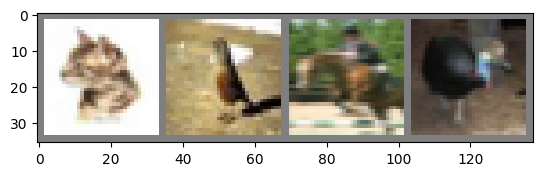

GroundTruth:    cat  bird horse  bird


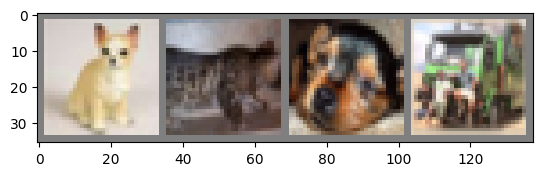

GroundTruth:    dog   cat   dog truck


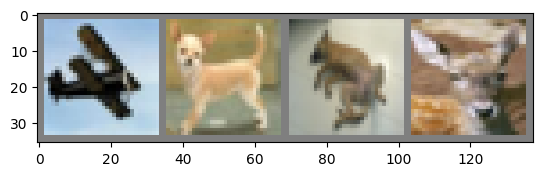

GroundTruth:  plane   dog   dog  deer


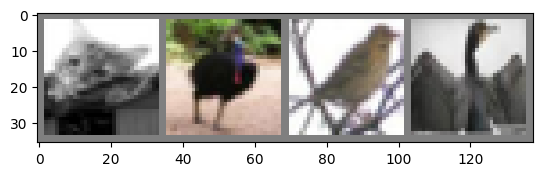

GroundTruth:    cat  bird  bird  bird


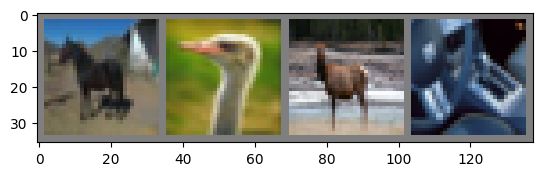

GroundTruth:  horse  bird  deer   car


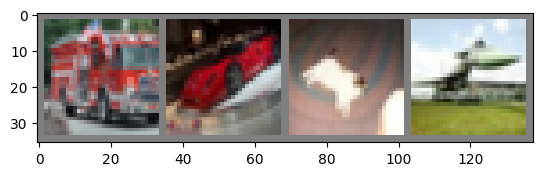

GroundTruth:  truck   car   cat plane


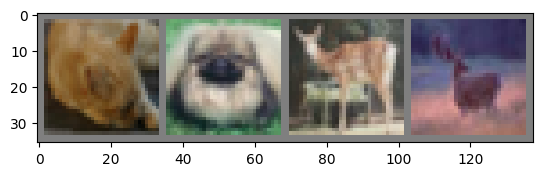

GroundTruth:    cat   dog  deer  deer


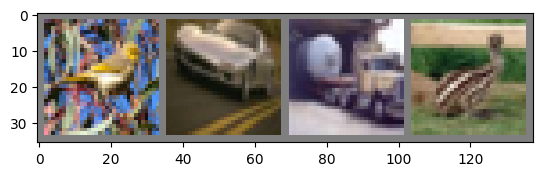

GroundTruth:   bird   car truck  bird


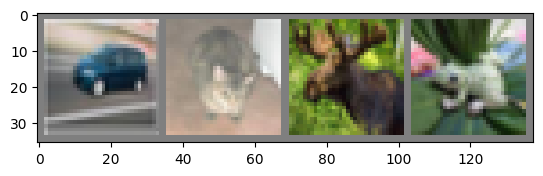

GroundTruth:    car   cat  deer  frog


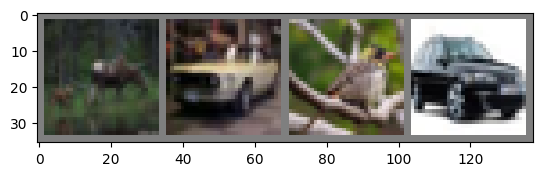

GroundTruth:   deer   car  bird   car


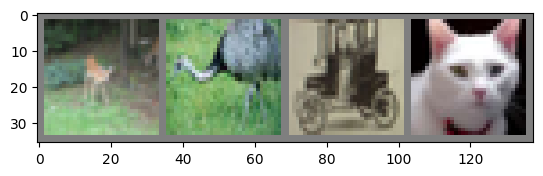

GroundTruth:   deer  bird   car   cat


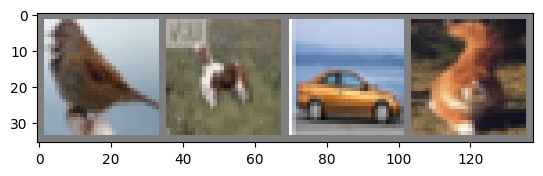

GroundTruth:   bird   dog   car   cat


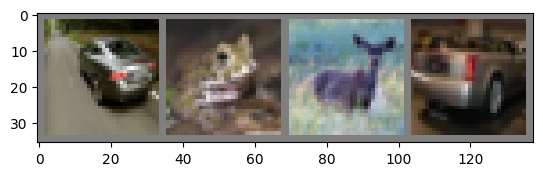

GroundTruth:    car  frog  deer   car


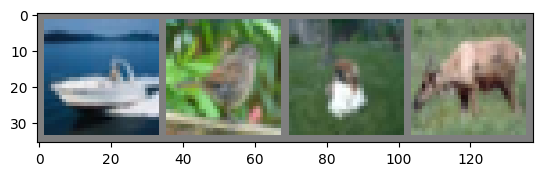

GroundTruth:   ship  bird   dog  deer


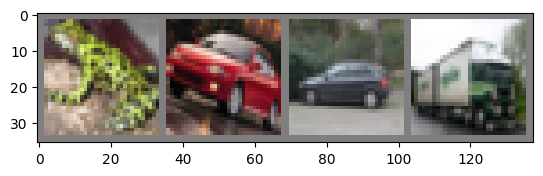

GroundTruth:   frog   car   car truck


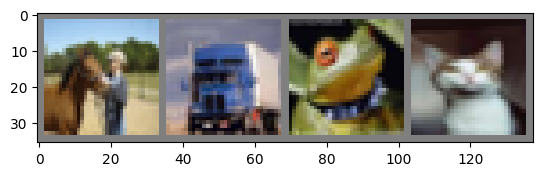

GroundTruth:  horse truck  frog   cat


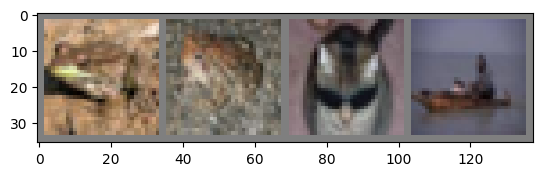

GroundTruth:   frog  frog   cat  ship


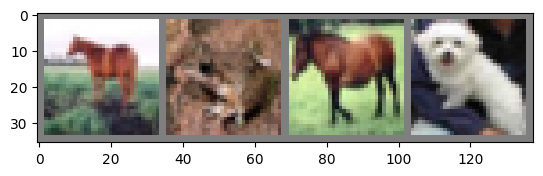

GroundTruth:  horse  frog horse   dog


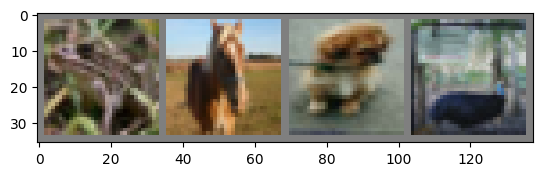

GroundTruth:   frog horse   dog  bird


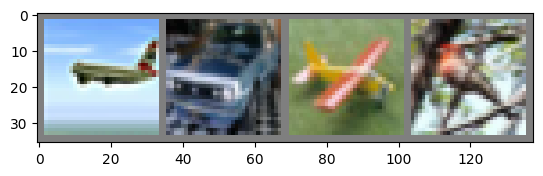

GroundTruth:  plane   car plane  bird


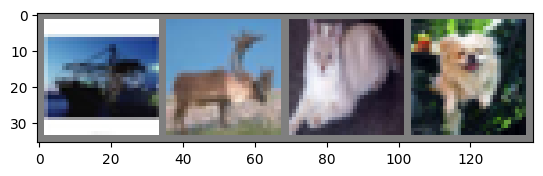

GroundTruth:   ship  deer   cat   dog


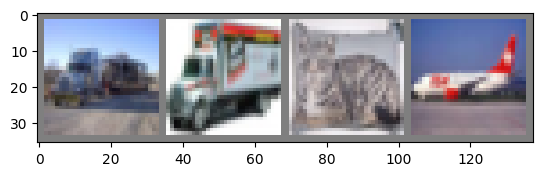

GroundTruth:  truck truck   cat plane


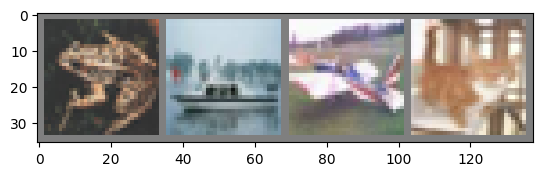

GroundTruth:   frog  ship plane   cat


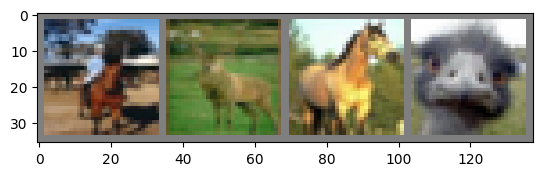

GroundTruth:  horse  deer horse  bird


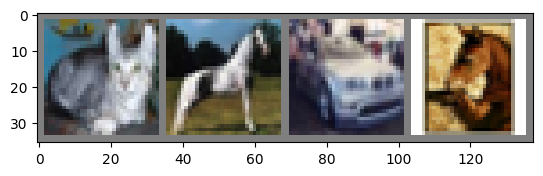

GroundTruth:    cat horse   car horse


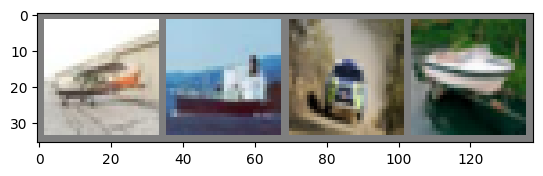

GroundTruth:  plane  ship   car  ship


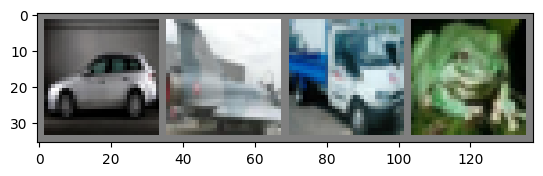

GroundTruth:    car plane truck  frog


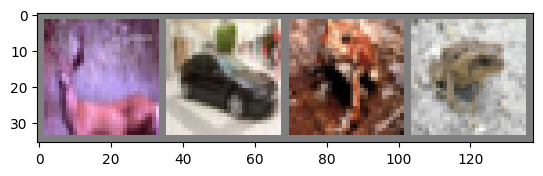

GroundTruth:   deer   car  frog  frog


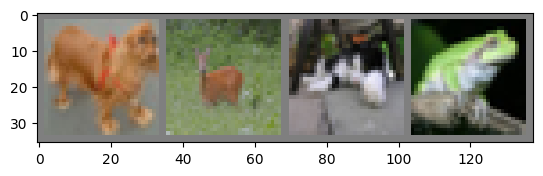

GroundTruth:    dog  deer   cat  frog


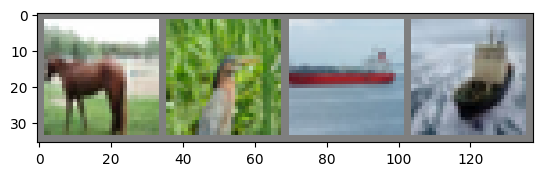

GroundTruth:  horse  bird  ship  ship


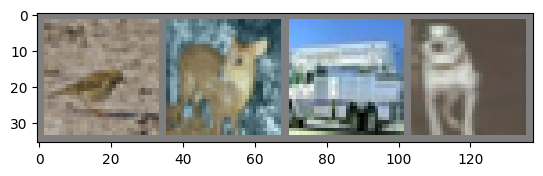

GroundTruth:   bird  deer truck   dog


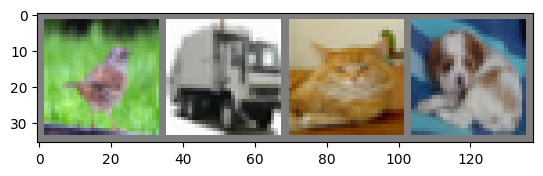

GroundTruth:   bird truck   cat   dog


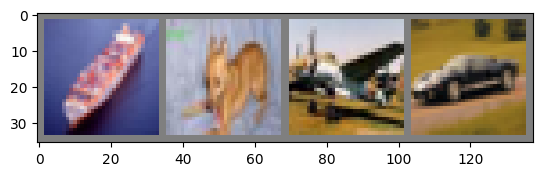

GroundTruth:   ship   dog plane   car


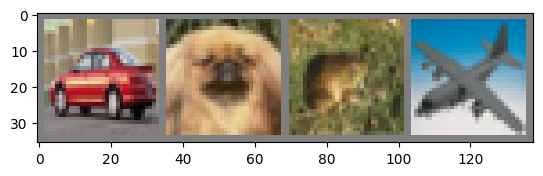

GroundTruth:    car   dog  frog plane


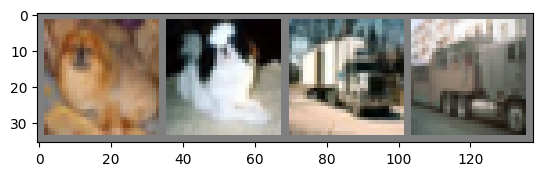

GroundTruth:    dog   dog truck truck


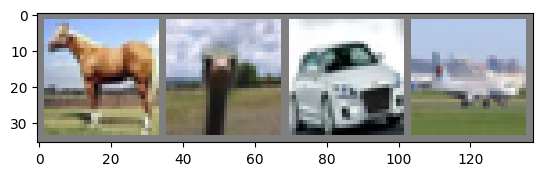

GroundTruth:  horse  bird   car plane


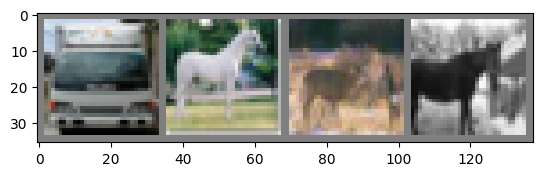

GroundTruth:  truck horse  deer horse


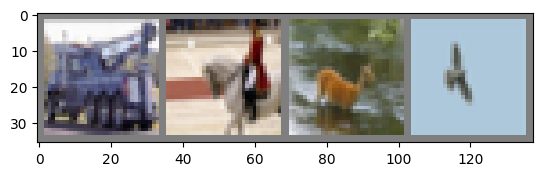

GroundTruth:  truck horse  deer  bird


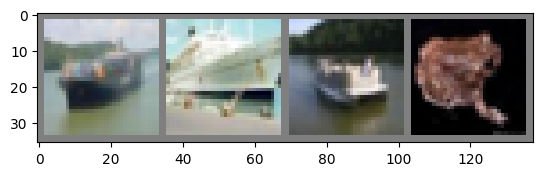

GroundTruth:   ship  ship  ship  frog


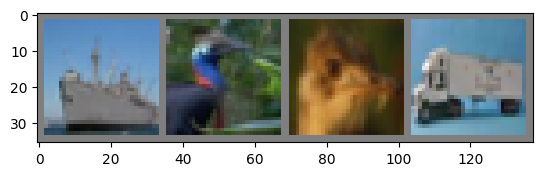

GroundTruth:   ship  bird  bird truck


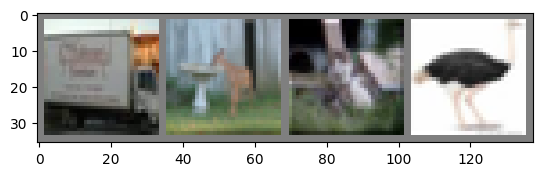

GroundTruth:  truck  deer   cat  bird


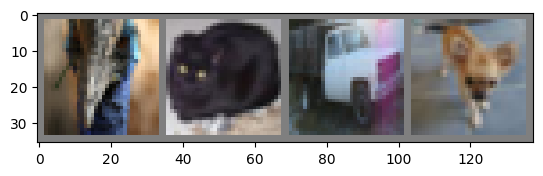

GroundTruth:   bird   cat truck   dog


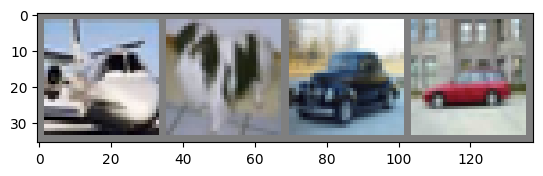

GroundTruth:  plane   dog   car   car


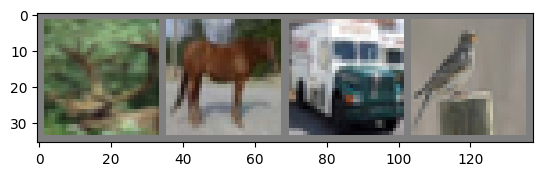

GroundTruth:   deer horse truck  bird


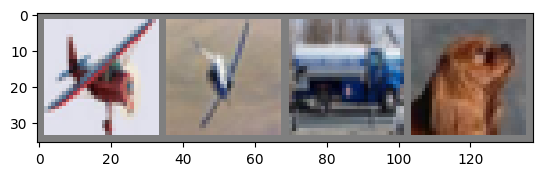

GroundTruth:  plane plane truck   dog


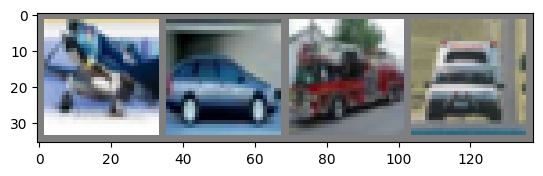

GroundTruth:  plane   car truck   car


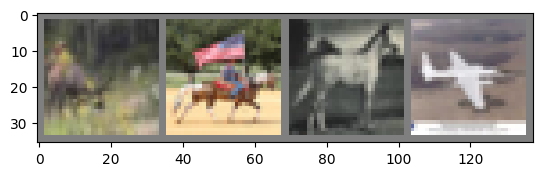

GroundTruth:   deer horse horse plane


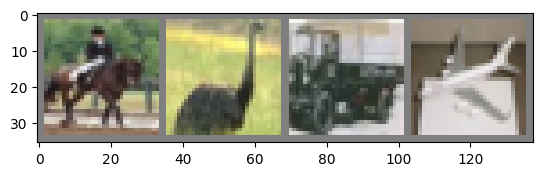

GroundTruth:  horse  bird truck plane


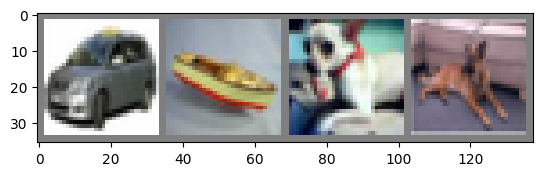

GroundTruth:    car  ship   dog   dog


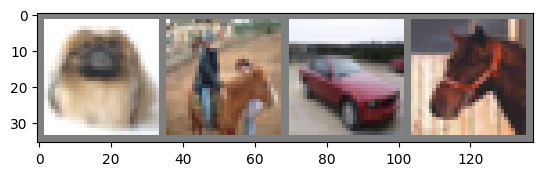

GroundTruth:    dog horse   car horse


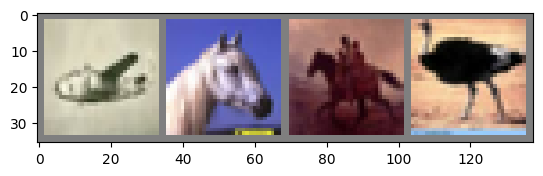

GroundTruth:  plane horse horse  bird


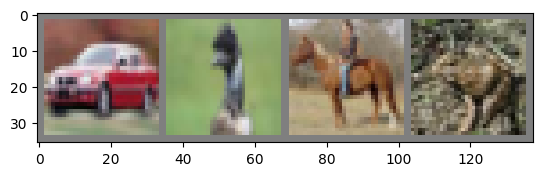

GroundTruth:    car  bird horse  frog


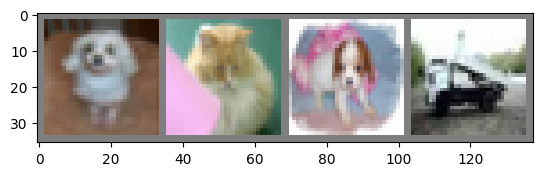

GroundTruth:    dog   cat   dog truck


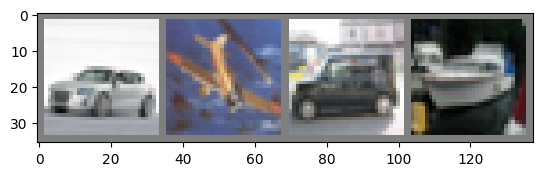

GroundTruth:    car plane   car  ship


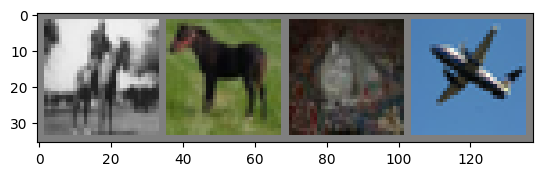

GroundTruth:  horse horse   cat plane


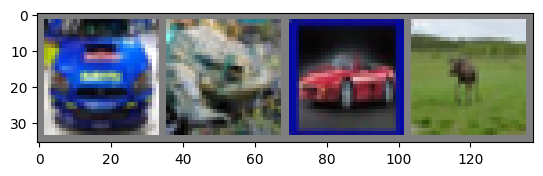

GroundTruth:    car  frog   car  deer


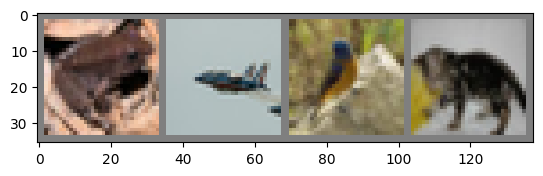

GroundTruth:   frog plane  bird   cat


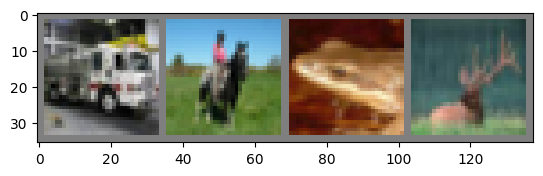

GroundTruth:  truck horse  frog  deer


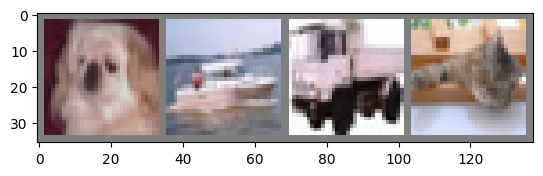

GroundTruth:    dog  ship truck   cat


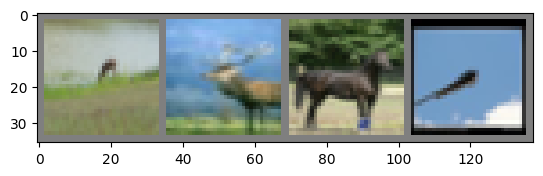

GroundTruth:   deer  deer horse plane


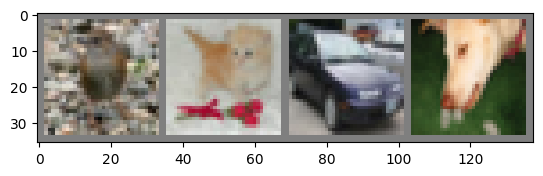

GroundTruth:   bird   cat   car   dog


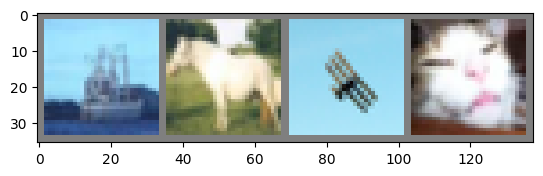

GroundTruth:   ship horse plane   cat


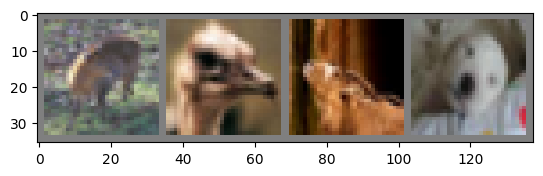

GroundTruth:   deer  bird  deer   dog


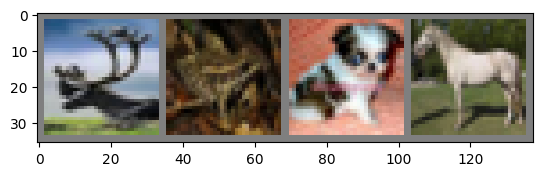

GroundTruth:   deer  frog   dog horse


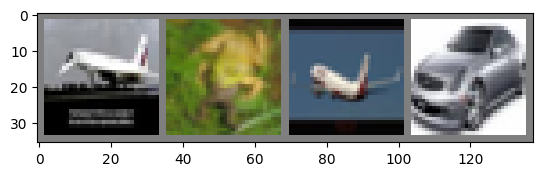

GroundTruth:  plane  frog plane   car


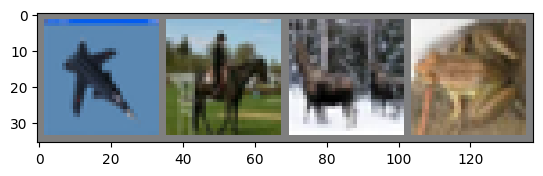

GroundTruth:  plane horse  deer  frog


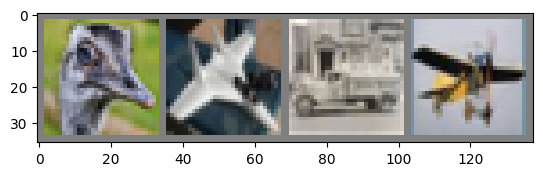

GroundTruth:   bird plane truck plane


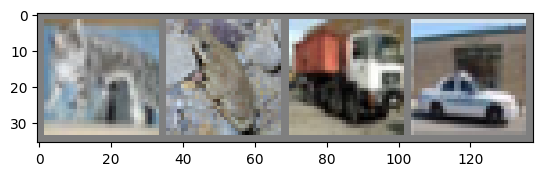

GroundTruth:    cat  frog truck   car


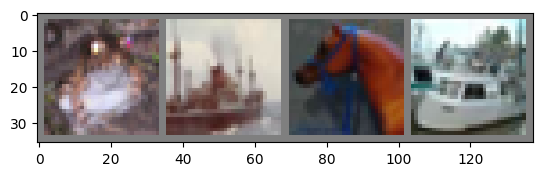

GroundTruth:   frog  ship horse  ship


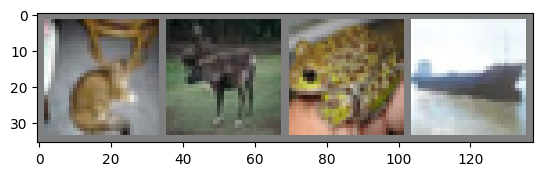

GroundTruth:    cat  deer  frog  ship


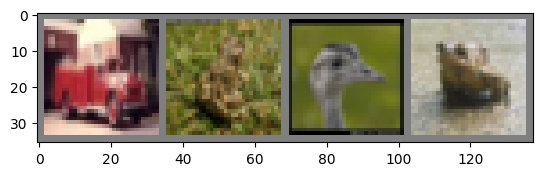

GroundTruth:  truck  frog  bird  frog


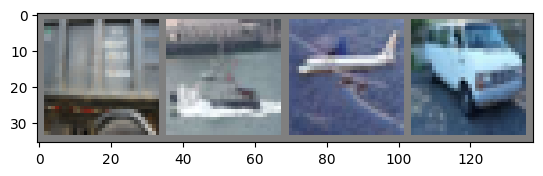

GroundTruth:  truck  ship plane   car


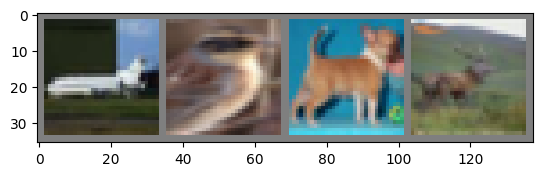

GroundTruth:  plane  bird   dog  deer


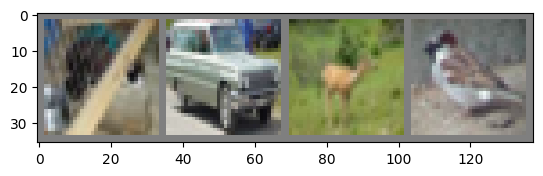

GroundTruth:    cat   car  deer  bird


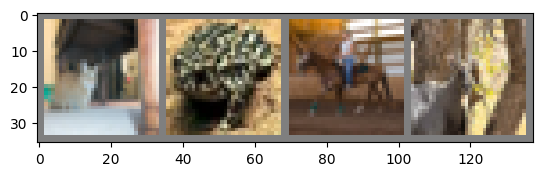

GroundTruth:    cat  frog horse  deer


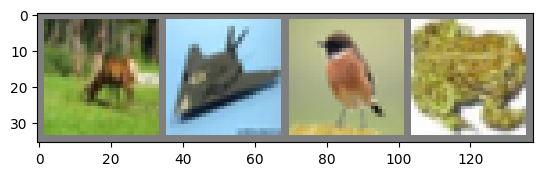

GroundTruth:   deer plane  bird  frog


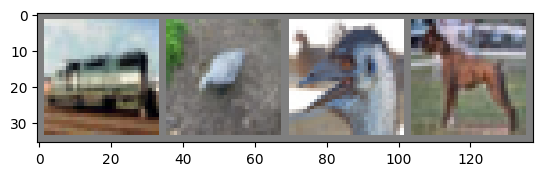

GroundTruth:  truck  bird  bird   dog


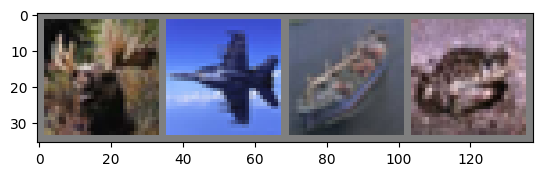

GroundTruth:   deer plane  ship  frog


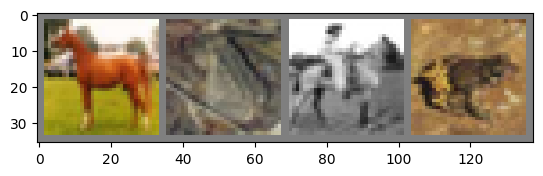

GroundTruth:  horse  frog horse  frog


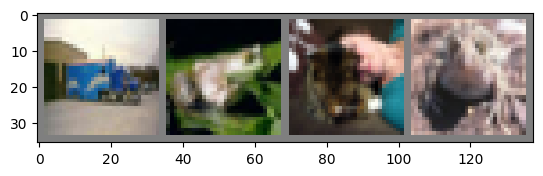

GroundTruth:  truck  frog   cat  frog


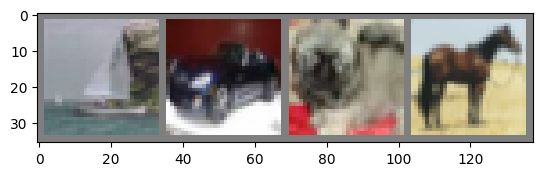

GroundTruth:   ship   car   dog horse


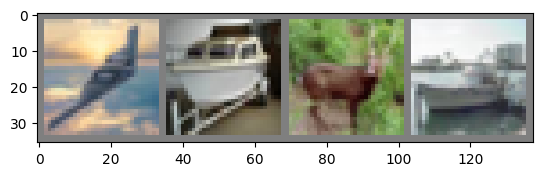

GroundTruth:  plane  ship  deer  ship


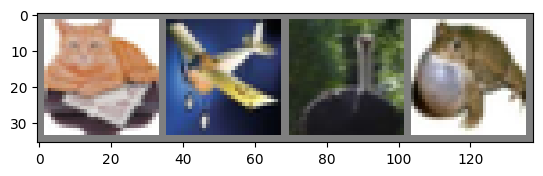

GroundTruth:    cat plane  bird  frog


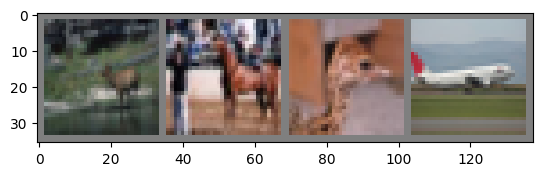

GroundTruth:   deer horse  bird plane


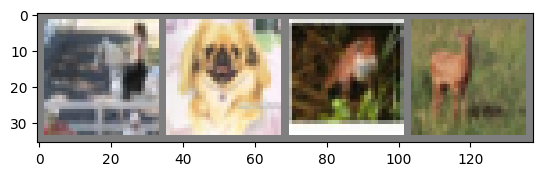

GroundTruth:  horse   dog  frog  deer


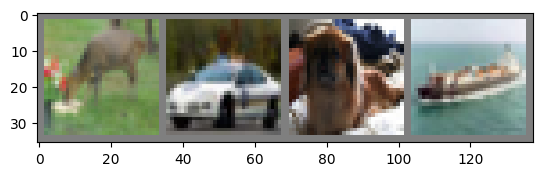

GroundTruth:   deer   car   dog  ship


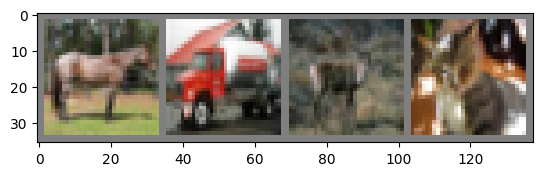

GroundTruth:  horse truck  deer   cat


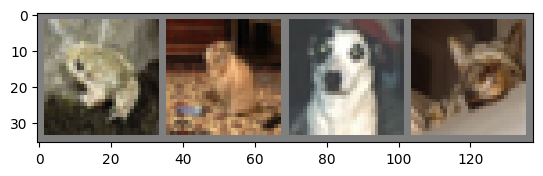

GroundTruth:   frog   cat   dog   cat


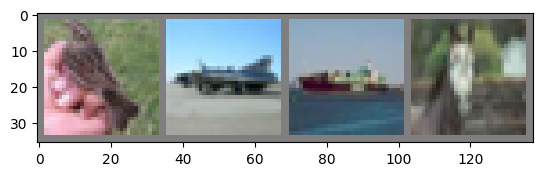

GroundTruth:   bird plane  ship horse


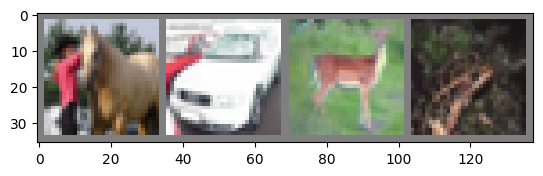

GroundTruth:  horse   car  deer  frog


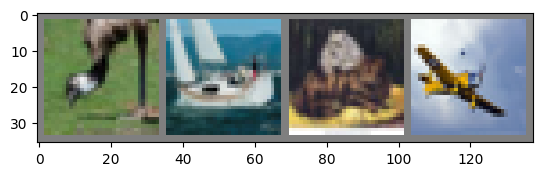

GroundTruth:   bird  ship   cat plane


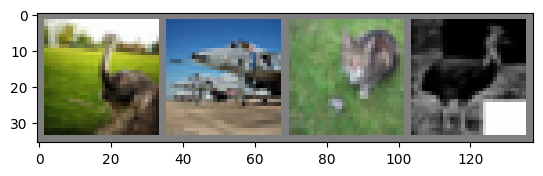

GroundTruth:   bird plane   cat  bird


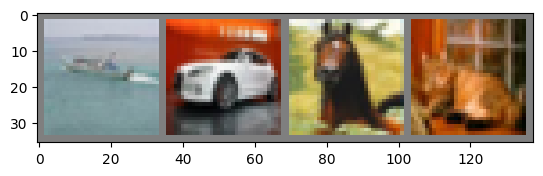

GroundTruth:   ship   car horse   cat


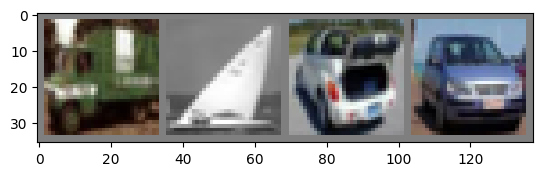

GroundTruth:  truck  ship   car   car


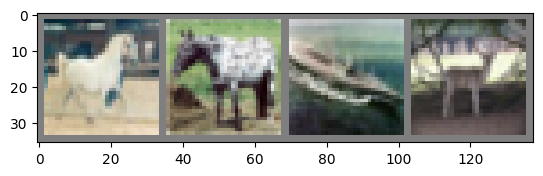

GroundTruth:  horse horse  ship  deer


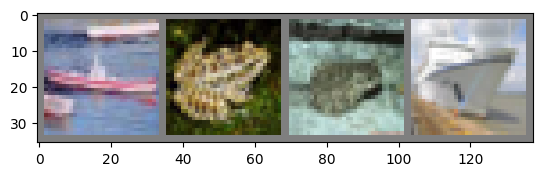

GroundTruth:   ship  frog  frog  ship


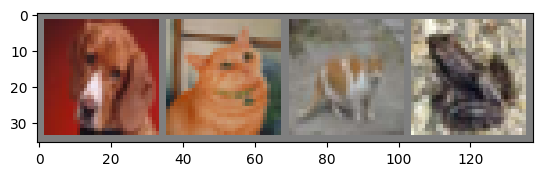

GroundTruth:    dog   cat   cat  frog


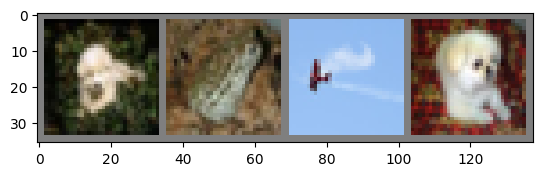

GroundTruth:    dog  frog plane   dog


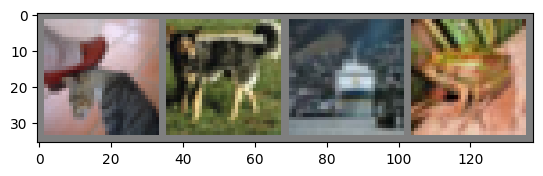

GroundTruth:    cat   dog  ship  frog


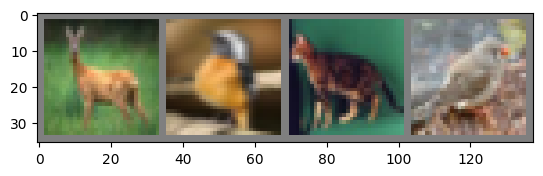

GroundTruth:   deer  bird   cat  bird


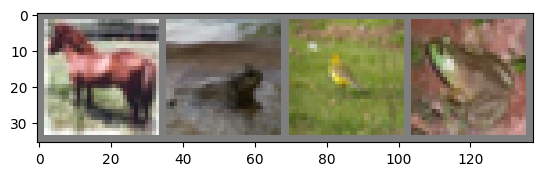

GroundTruth:  horse  frog  bird  frog


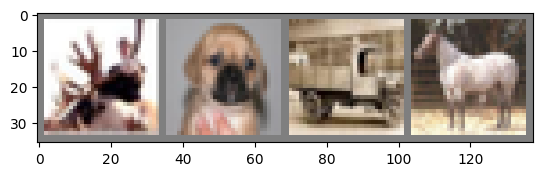

GroundTruth:   deer   dog truck horse


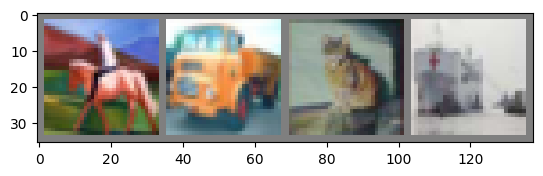

GroundTruth:  horse truck   cat  ship


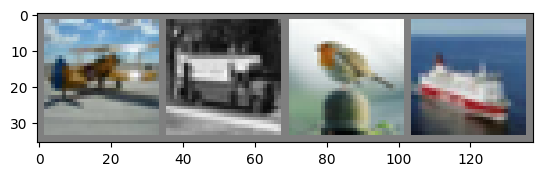

GroundTruth:  plane truck  bird  ship


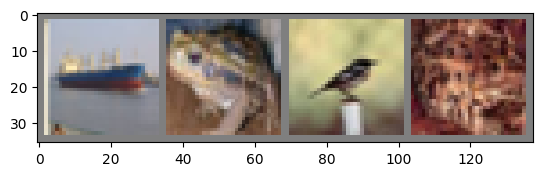

GroundTruth:   ship  frog  bird  frog


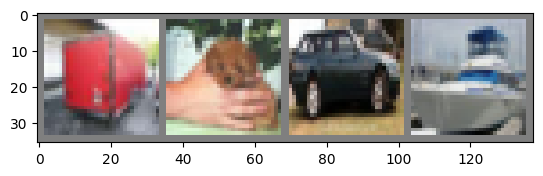

GroundTruth:  truck   dog   car  ship


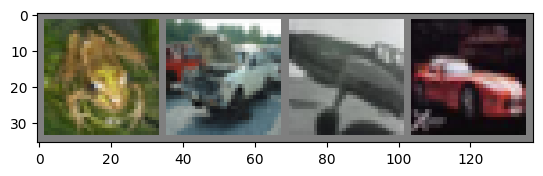

GroundTruth:   frog   car plane   car


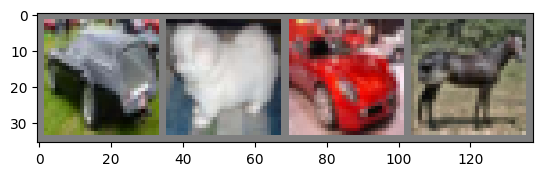

GroundTruth:    car   dog   car horse


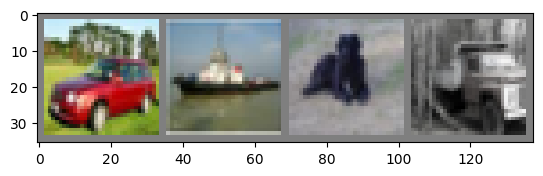

GroundTruth:    car  ship   dog truck


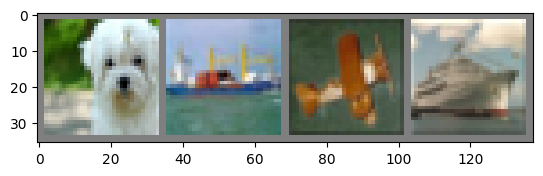

GroundTruth:    dog  ship plane  ship


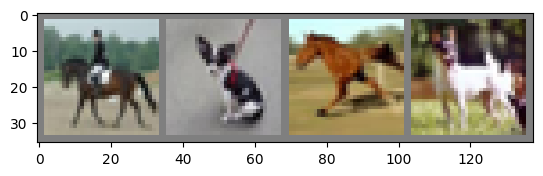

GroundTruth:  horse   dog horse   dog


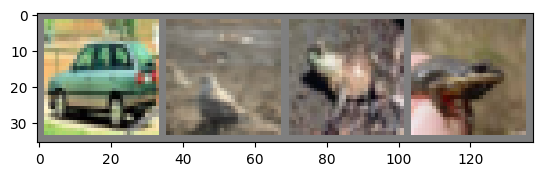

GroundTruth:    car  bird  frog  frog


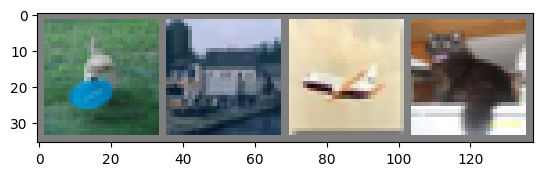

GroundTruth:    dog truck plane   cat


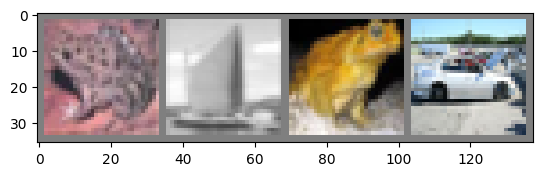

GroundTruth:   frog  ship  frog   car


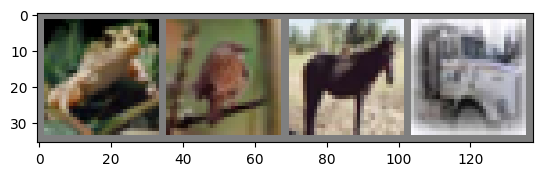

GroundTruth:   frog  bird horse truck


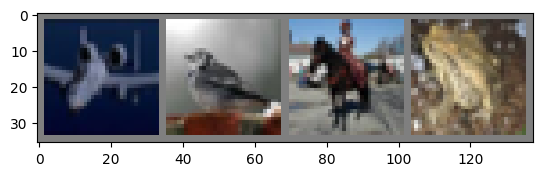

GroundTruth:  plane  bird horse  frog


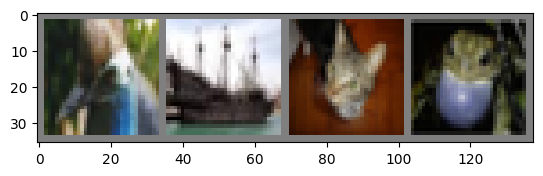

GroundTruth:   bird  ship   cat  frog


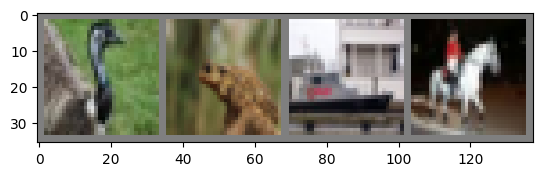

GroundTruth:   bird  frog  ship horse


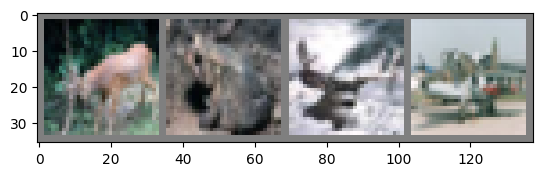

GroundTruth:   deer  frog  deer plane


KeyboardInterrupt: 

In [58]:
# See `here <https://pytorch.org/docs/stable/notes/serialization.html>`_
# for more details on saving PyTorch models.
#
# 5. Test the network on the test data
# ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#
# We have trained the network for 2 passes over the training dataset.
# But we need to check if the network has learnt anything at all.
#
# We will check this by predicting the class label that the neural network
# outputs, and checking it against the ground-truth. If the prediction is
# correct, we add the sample to the list of correct predictions.
#
# Okay, first step. Let us display an image from the test set to get familiar.

# dataiter = iter(testloader)
# images, labels = dataiter.next()

for images, labels in trainloader:
    # print images
    imshow(torchvision.utils.make_grid(images))
    print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))

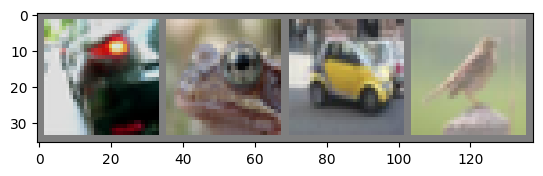

GroundTruth:    car  frog   car  bird


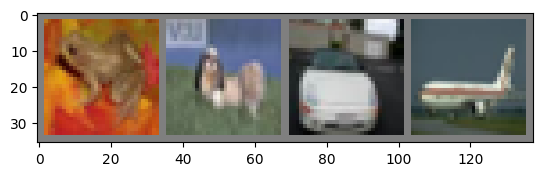

GroundTruth:   frog   dog   car plane


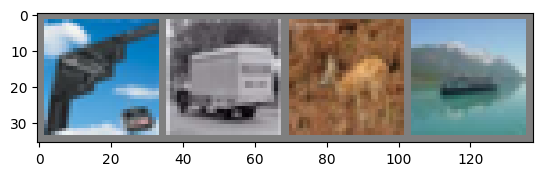

GroundTruth:  plane truck  deer  ship


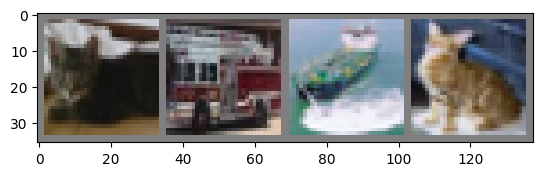

GroundTruth:    cat truck  ship   cat


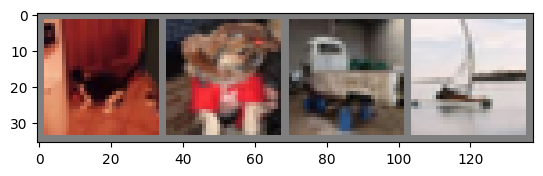

GroundTruth:    cat   dog truck  ship


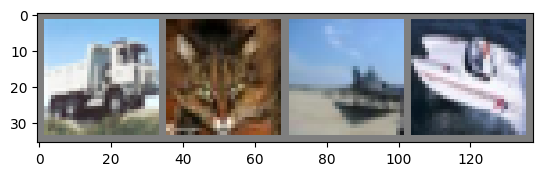

GroundTruth:  truck   cat plane  ship


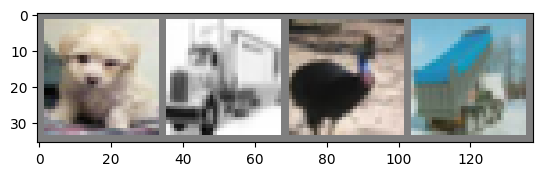

GroundTruth:    dog truck  bird truck


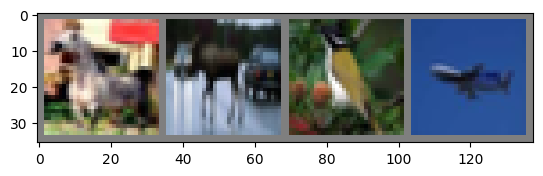

GroundTruth:  horse  deer  bird plane


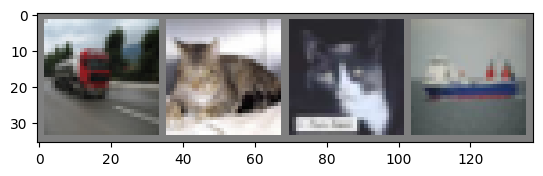

GroundTruth:  truck   cat   cat  ship


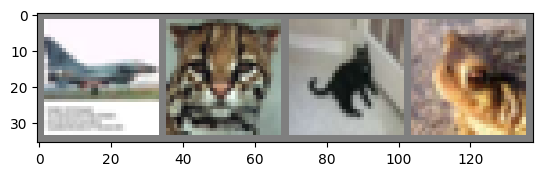

GroundTruth:  plane   cat   cat  frog


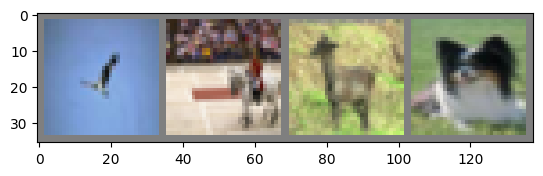

GroundTruth:   bird horse  deer   dog


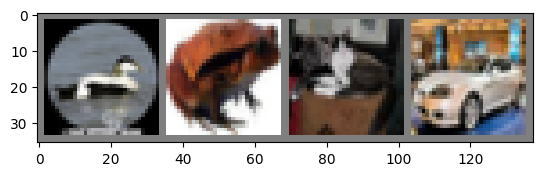

GroundTruth:   bird  frog   cat   car


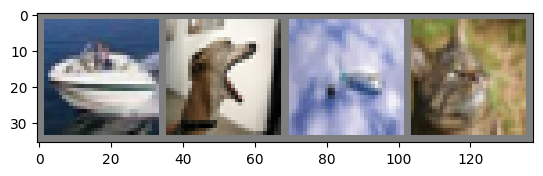

GroundTruth:   ship   dog plane   cat


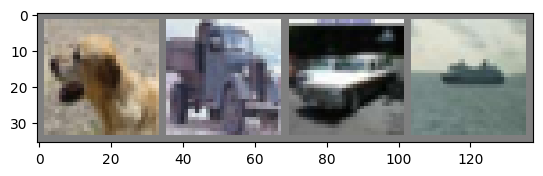

GroundTruth:    dog truck   car  ship


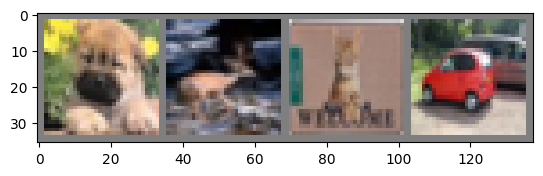

GroundTruth:    dog  deer   cat   car


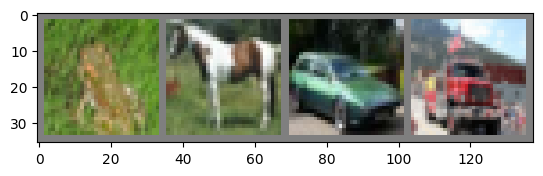

GroundTruth:   frog horse   car truck


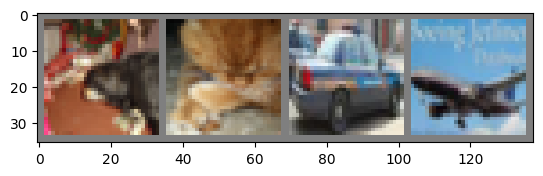

GroundTruth:    dog   cat   car plane


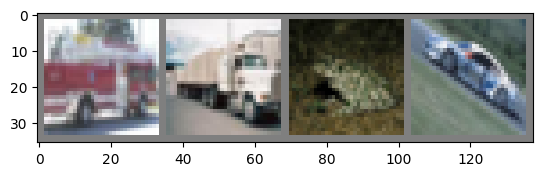

GroundTruth:  truck truck  frog   car


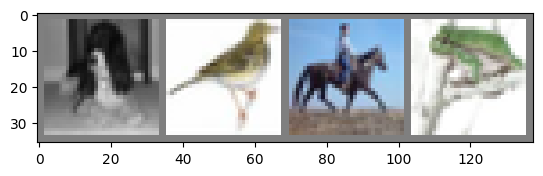

GroundTruth:    dog  bird horse  frog


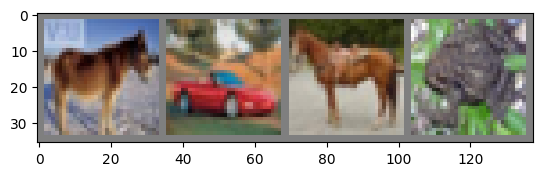

GroundTruth:  horse   car horse  frog


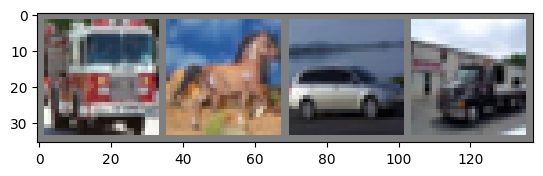

GroundTruth:  truck horse   car truck


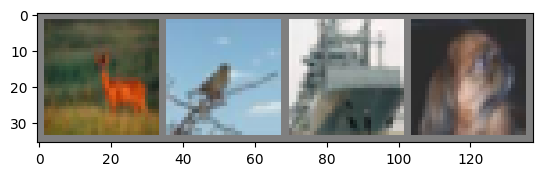

GroundTruth:   deer  bird  ship   dog


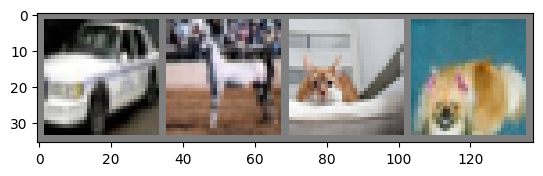

GroundTruth:    car horse   cat   dog


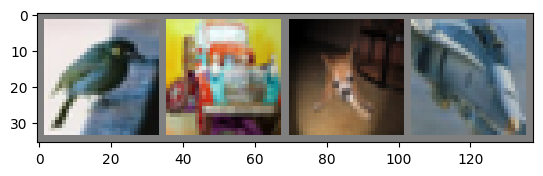

GroundTruth:   bird truck   dog plane


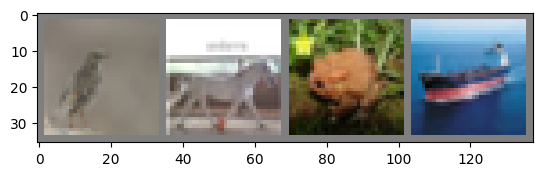

GroundTruth:   bird horse  frog  ship


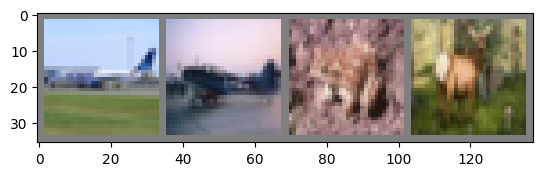

GroundTruth:  plane plane  frog  deer


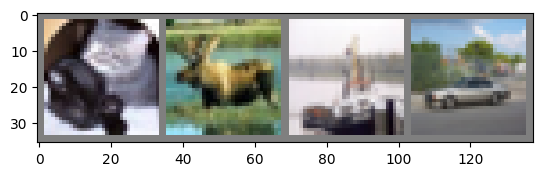

GroundTruth:    cat  deer  ship   car


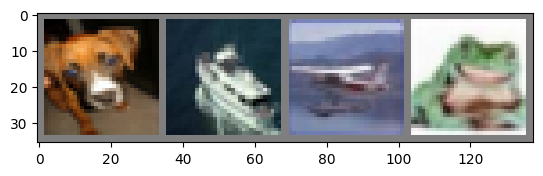

GroundTruth:    dog  ship plane  frog


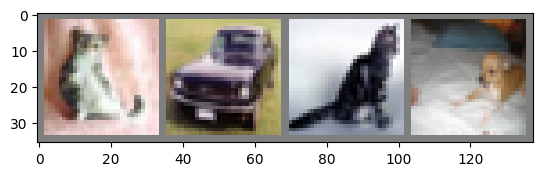

GroundTruth:    cat   car   cat   dog


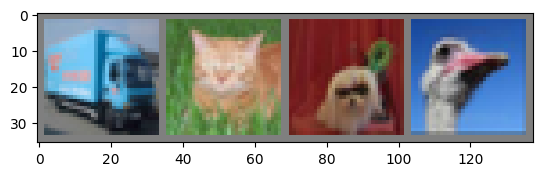

GroundTruth:  truck   cat   dog  bird


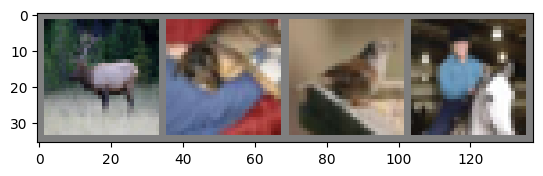

GroundTruth:   deer   dog  bird horse


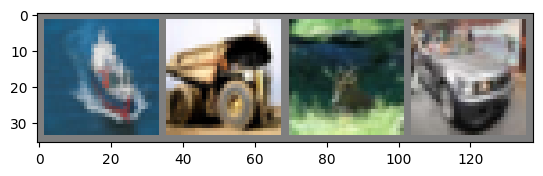

GroundTruth:   ship truck  deer   car


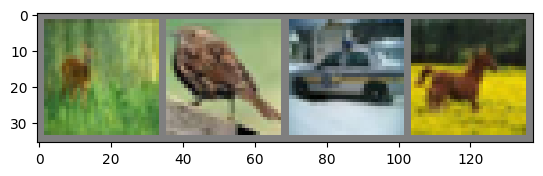

GroundTruth:   deer  bird   car horse


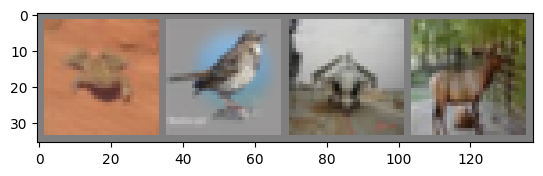

GroundTruth:   frog  bird plane  deer


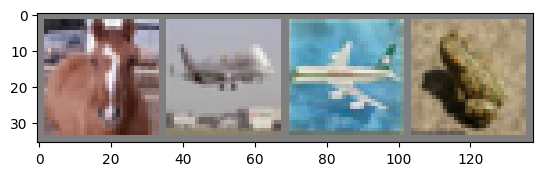

GroundTruth:  horse plane plane  frog


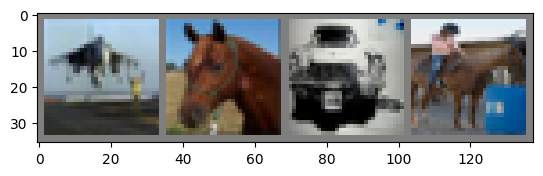

GroundTruth:  plane horse   car horse


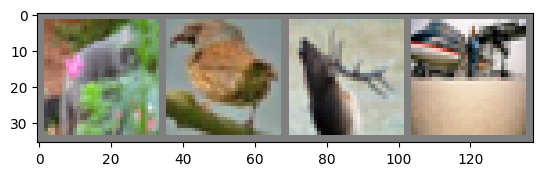

GroundTruth:    cat  bird  deer plane


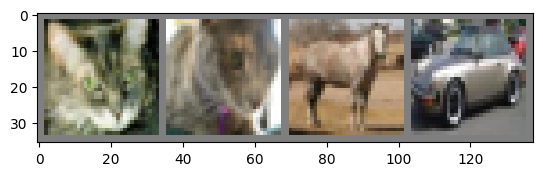

GroundTruth:    cat   cat horse   car


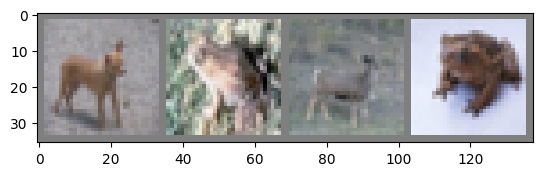

GroundTruth:    dog  frog  deer  frog


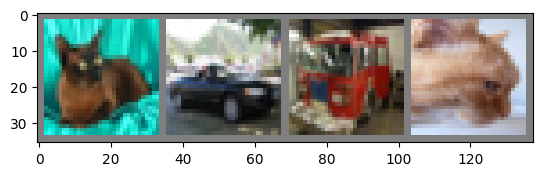

GroundTruth:    cat   car truck   cat


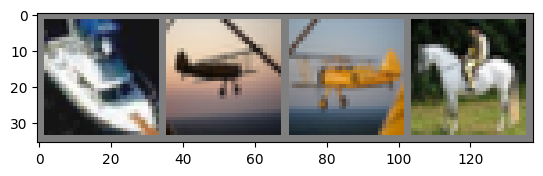

GroundTruth:   ship plane plane horse


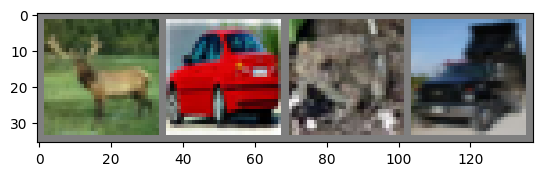

GroundTruth:   deer   car  frog truck


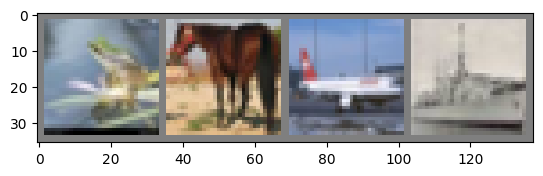

GroundTruth:   frog horse plane  ship


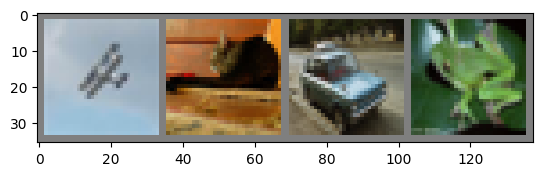

GroundTruth:  plane   cat   car  frog


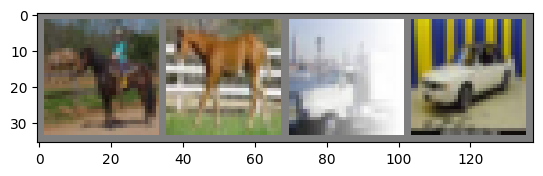

GroundTruth:  horse horse truck   car


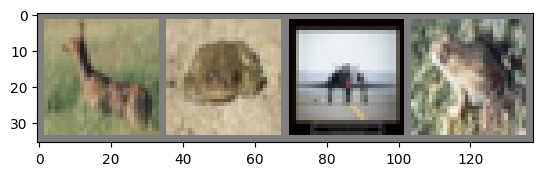

GroundTruth:   deer  frog plane  frog


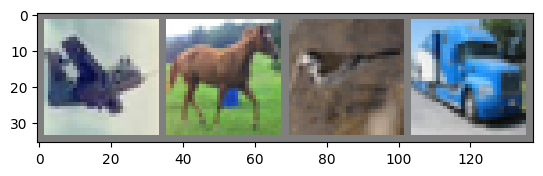

GroundTruth:  plane horse  bird truck


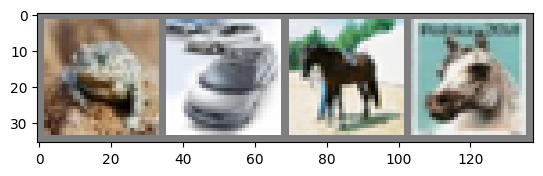

GroundTruth:   frog   car horse horse


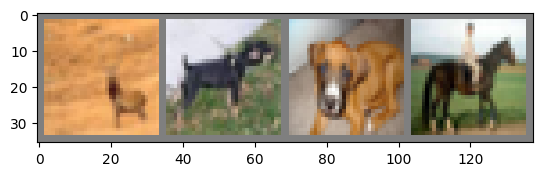

GroundTruth:   deer   dog   dog horse


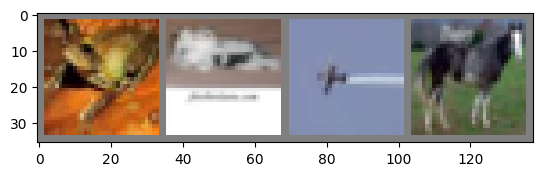

GroundTruth:   frog   cat plane horse


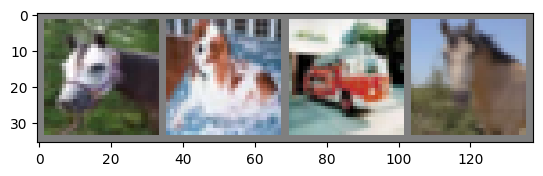

GroundTruth:  horse   dog truck horse


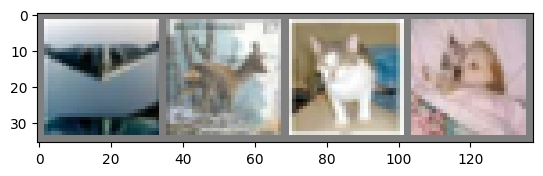

GroundTruth:  plane  deer   cat   cat


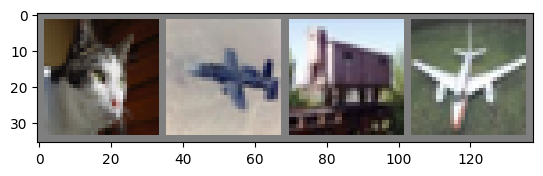

GroundTruth:    cat plane truck plane


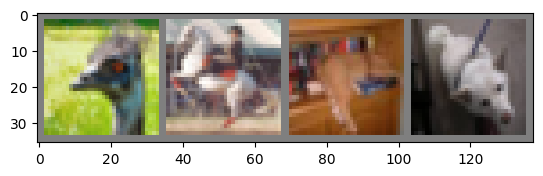

GroundTruth:   bird horse   cat   dog


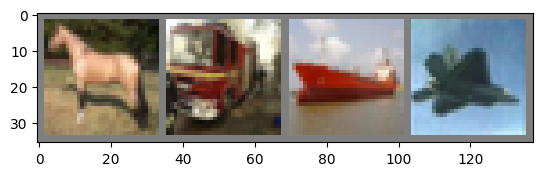

GroundTruth:  horse truck  ship plane


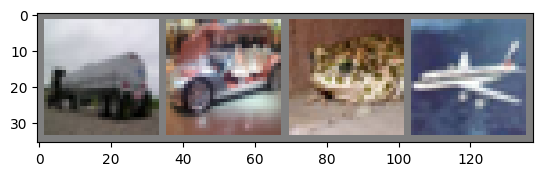

GroundTruth:  truck   car  frog plane


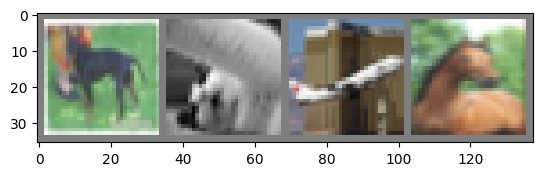

GroundTruth:    dog   cat plane horse


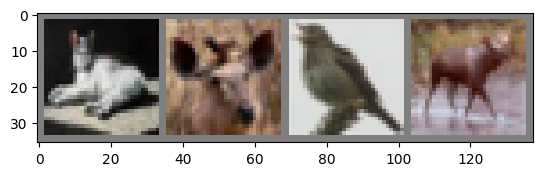

GroundTruth:    cat  deer  bird  deer


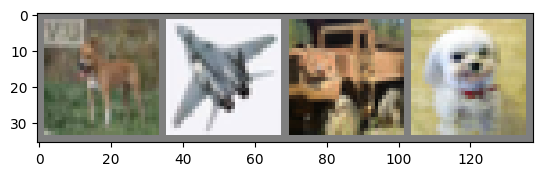

GroundTruth:    dog plane truck   dog


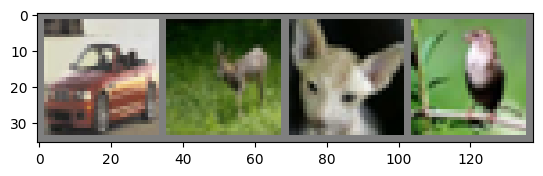

GroundTruth:    car  deer   cat  bird


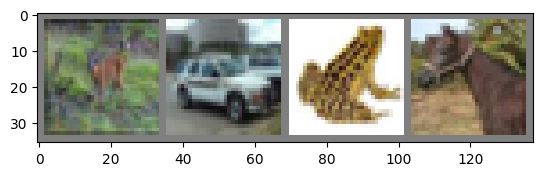

GroundTruth:   deer   car  frog horse


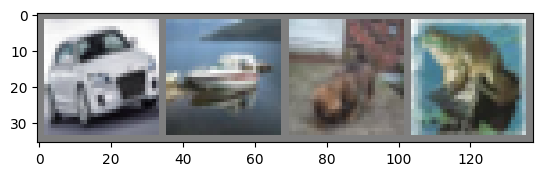

GroundTruth:    car  ship   dog  frog


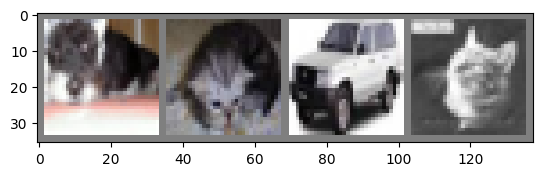

GroundTruth:    dog   cat   car   cat


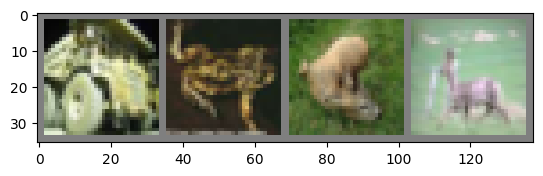

GroundTruth:  truck  frog  deer  deer


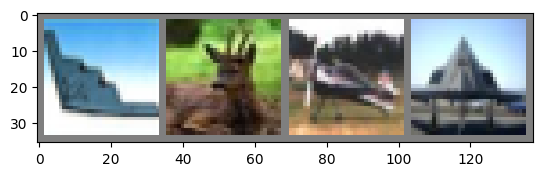

GroundTruth:  plane  deer plane plane


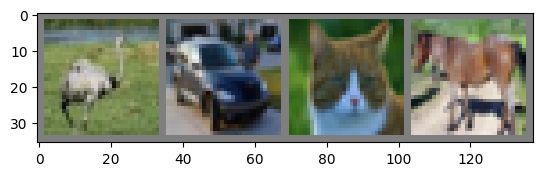

GroundTruth:   bird   car   cat horse


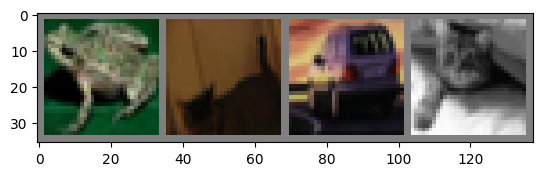

GroundTruth:   frog   cat   car   cat


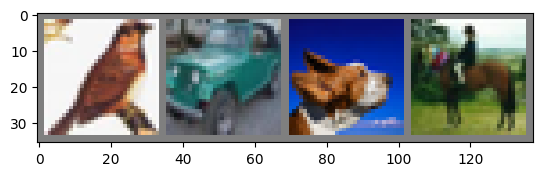

GroundTruth:   bird   car   dog horse


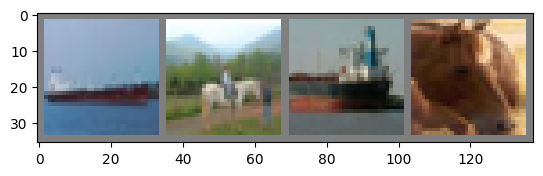

GroundTruth:   ship horse  ship horse


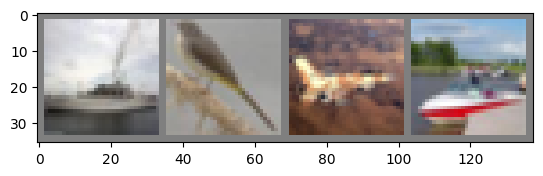

GroundTruth:   ship  bird plane  ship


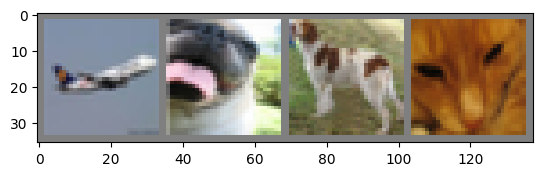

GroundTruth:  plane   dog   dog   cat


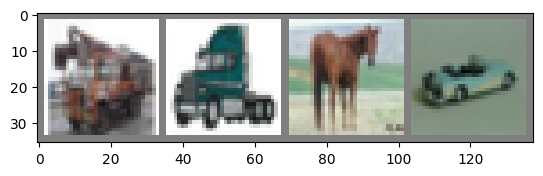

GroundTruth:  truck truck horse   car


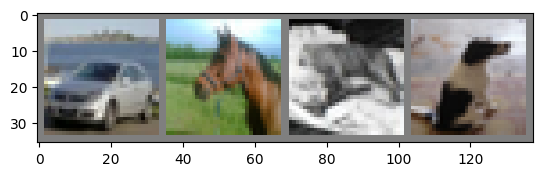

GroundTruth:    car horse   cat   dog


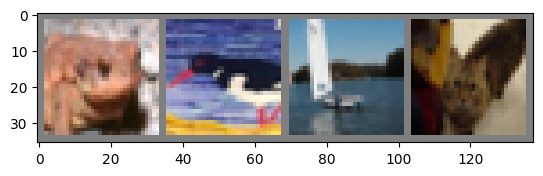

GroundTruth:   frog  bird  ship   cat


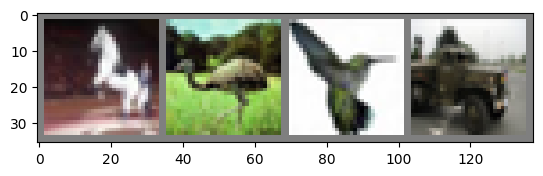

GroundTruth:  horse  bird  bird truck


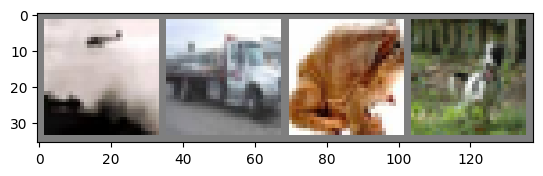

GroundTruth:  plane truck  frog   dog


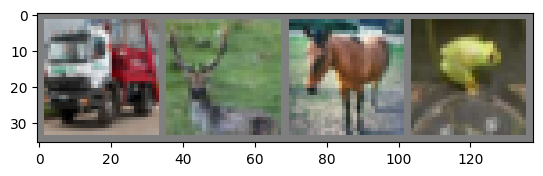

GroundTruth:  truck  deer horse  frog


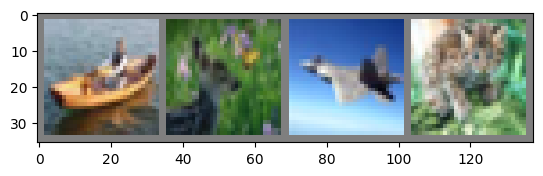

GroundTruth:   ship  deer plane   cat


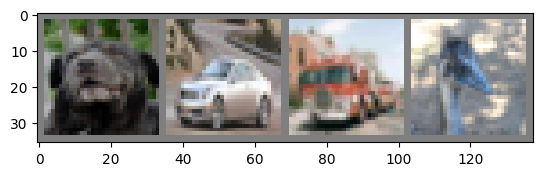

GroundTruth:    dog   car truck  bird


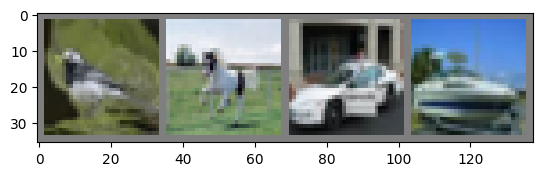

GroundTruth:   bird horse   car  ship


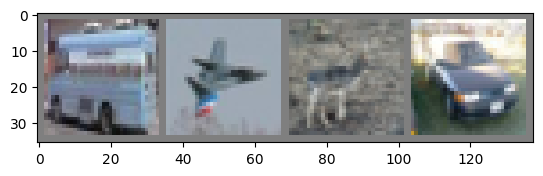

GroundTruth:  truck plane  deer   car


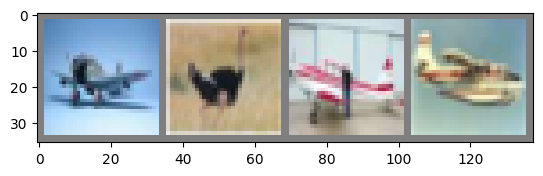

GroundTruth:  plane  bird plane plane


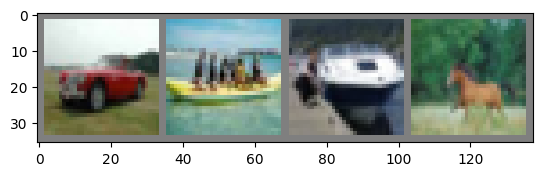

GroundTruth:    car  ship  ship horse


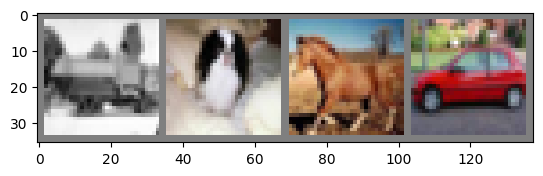

GroundTruth:  truck   dog horse   car


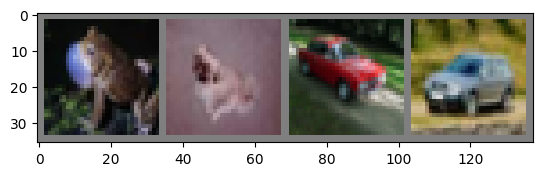

GroundTruth:   frog   dog   car   car


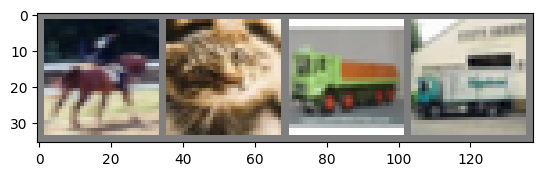

GroundTruth:  horse   cat truck truck


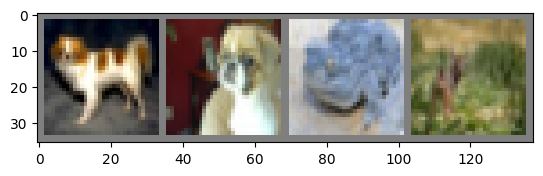

GroundTruth:    dog   dog  frog  deer


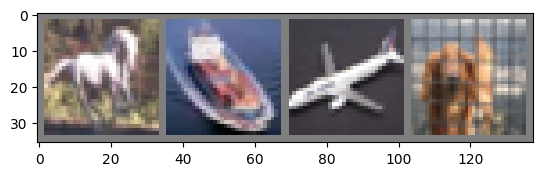

GroundTruth:  horse  ship plane   dog


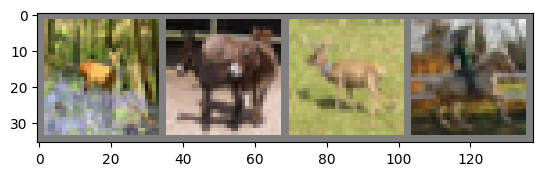

GroundTruth:   deer  deer  deer horse


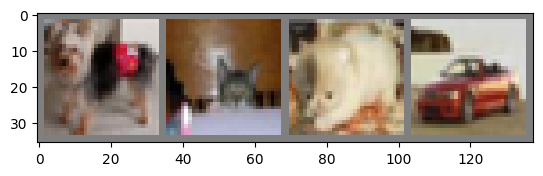

GroundTruth:    dog   cat   cat   car


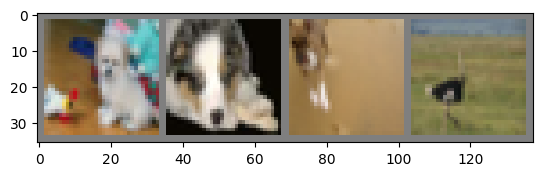

GroundTruth:    dog   dog   dog  bird


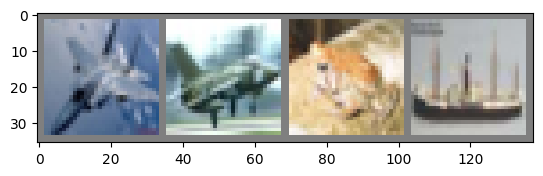

GroundTruth:  plane plane  frog  ship


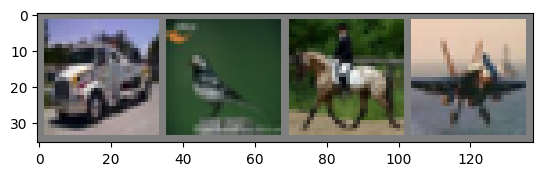

GroundTruth:  truck  bird horse plane


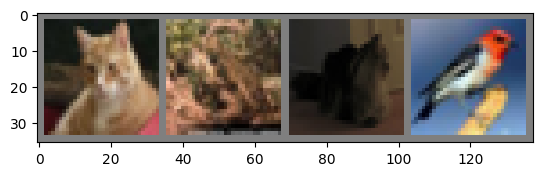

GroundTruth:    cat  frog   cat  bird


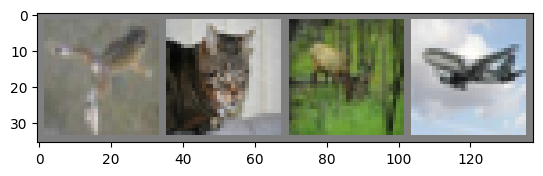

GroundTruth:   frog   cat  deer plane


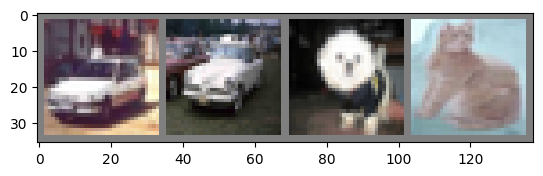

GroundTruth:    car   car   dog   cat


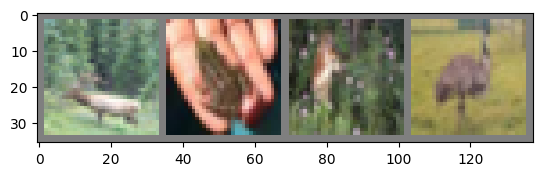

GroundTruth:   deer  frog  deer  bird


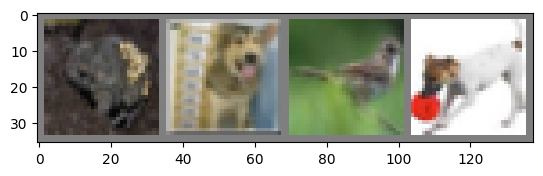

GroundTruth:   frog   dog  bird   dog


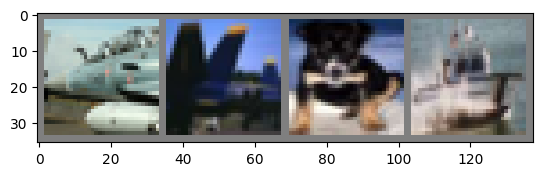

GroundTruth:  plane plane   dog  ship


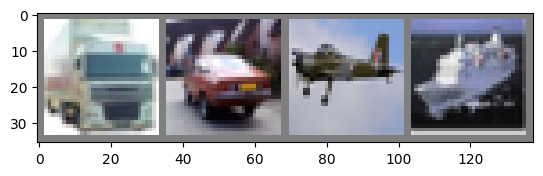

GroundTruth:  truck   car plane  ship


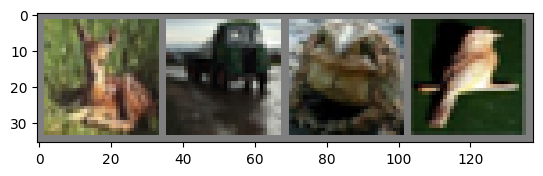

GroundTruth:   deer truck  frog  bird


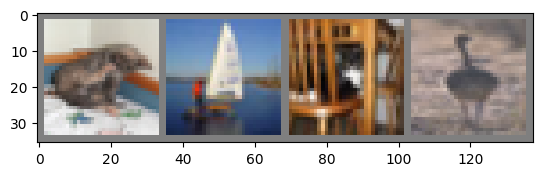

GroundTruth:    cat  ship   cat  bird


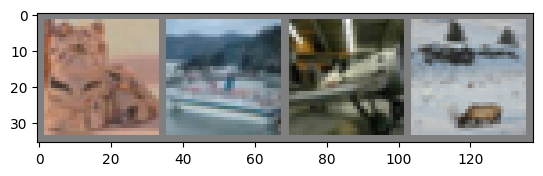

GroundTruth:    cat  ship plane  deer


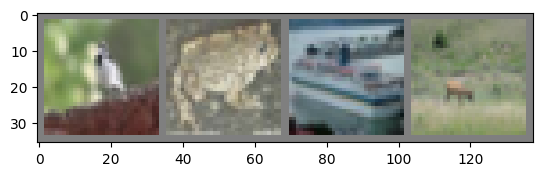

GroundTruth:   bird  frog  ship  deer


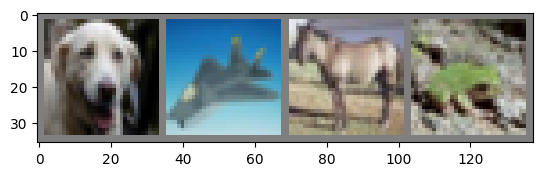

GroundTruth:    dog plane horse  frog


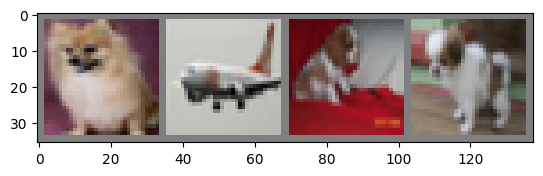

GroundTruth:    dog plane   dog   dog


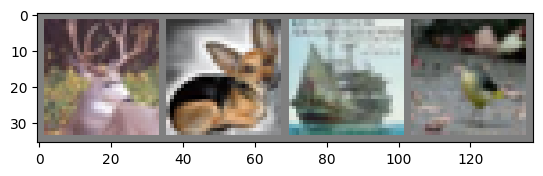

GroundTruth:   deer   dog  ship  bird


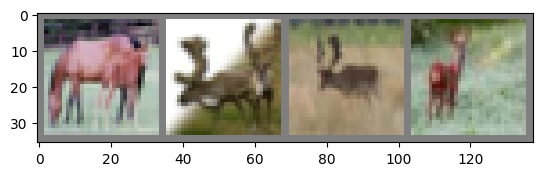

GroundTruth:  horse  deer  deer  deer


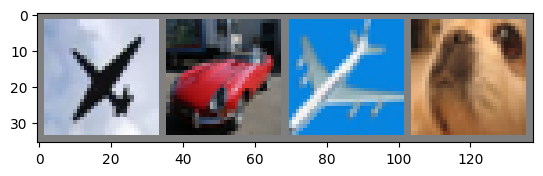

GroundTruth:  plane   car plane   dog


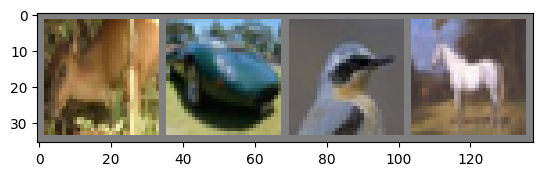

GroundTruth:   deer   car  bird horse


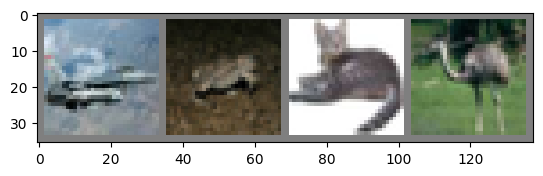

GroundTruth:  plane  frog   cat  bird


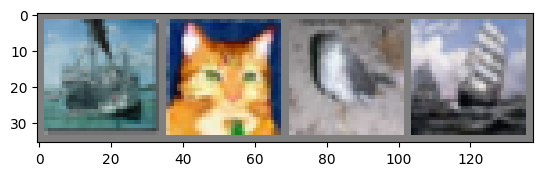

GroundTruth:   ship   cat  bird  ship


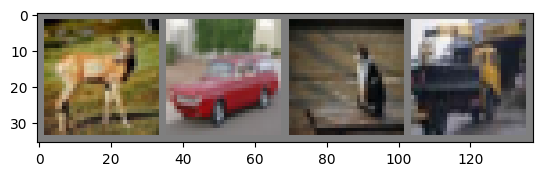

GroundTruth:   deer   car   cat truck


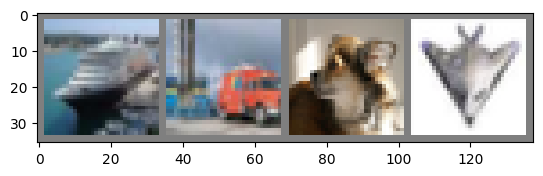

GroundTruth:   ship truck   dog plane


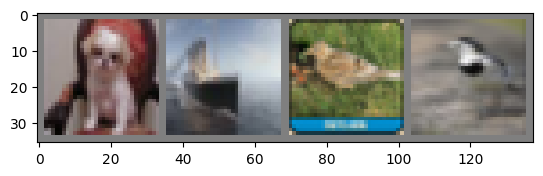

GroundTruth:    dog  ship  bird  bird


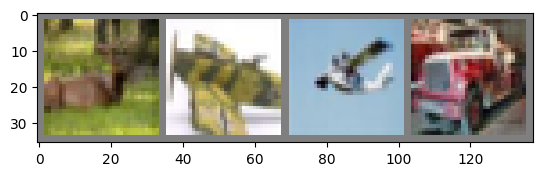

GroundTruth:   deer plane plane truck


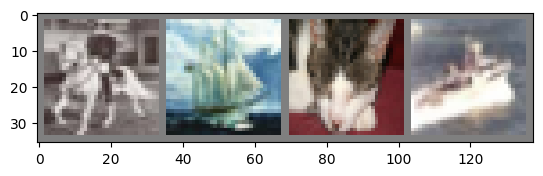

GroundTruth:  horse  ship   cat  ship


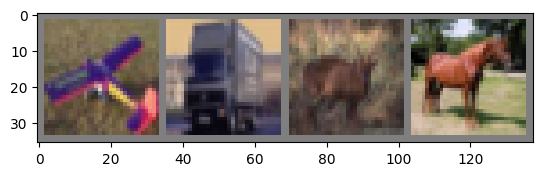

GroundTruth:  plane truck  deer horse


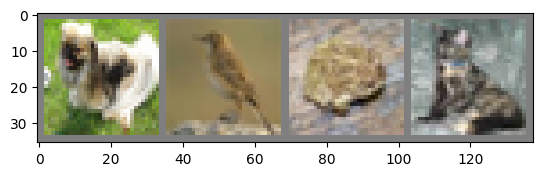

GroundTruth:    dog  bird  frog   cat


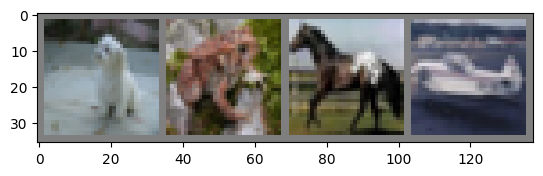

GroundTruth:    dog  frog horse plane


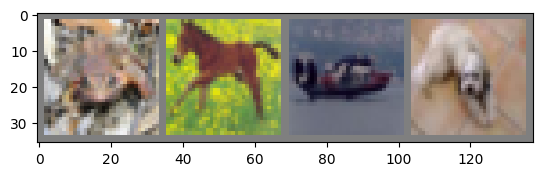

GroundTruth:   frog horse plane   dog


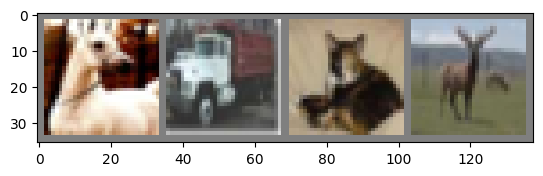

GroundTruth:  horse truck   cat  deer


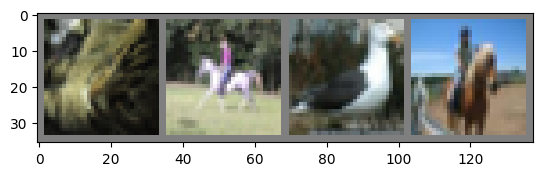

GroundTruth:    cat horse  bird horse


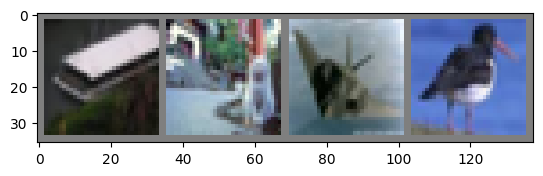

GroundTruth:   ship   cat plane  bird


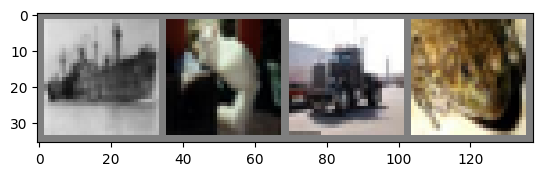

GroundTruth:   ship   cat truck  frog


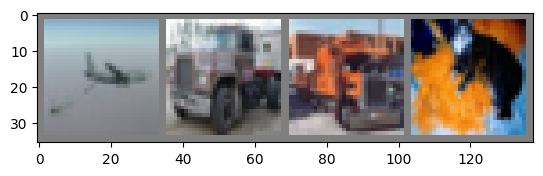

GroundTruth:  plane truck truck   cat


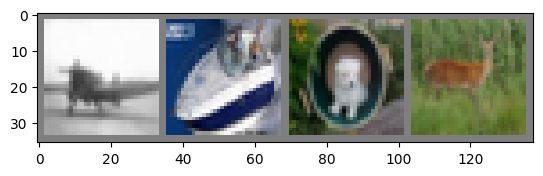

GroundTruth:  plane  ship   dog  deer


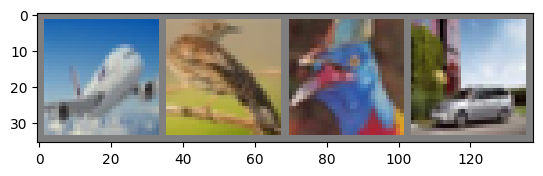

GroundTruth:  plane  bird  bird   car


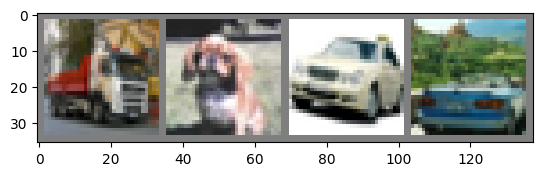

GroundTruth:  truck   dog   car   car


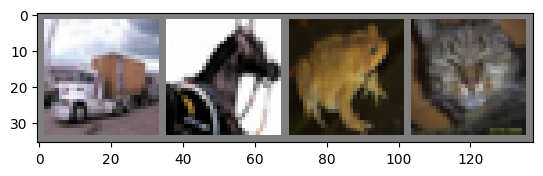

GroundTruth:  truck horse  frog   cat


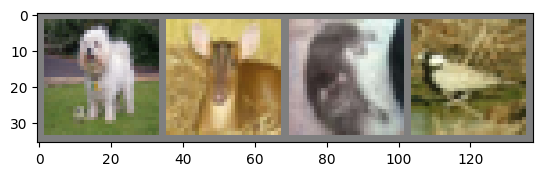

GroundTruth:    dog  deer   cat  bird


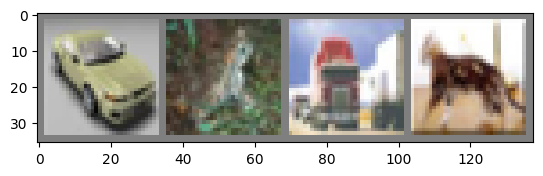

GroundTruth:    car  frog truck   cat


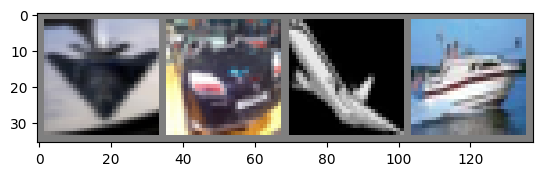

GroundTruth:  plane   car plane  ship


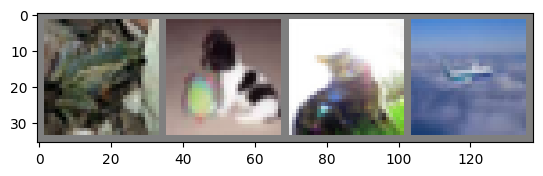

GroundTruth:   frog   dog   cat plane


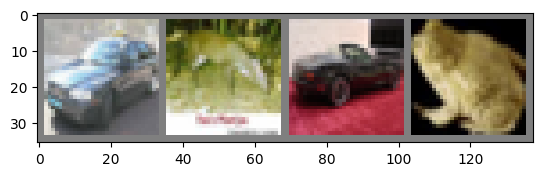

GroundTruth:    car  deer   car  frog


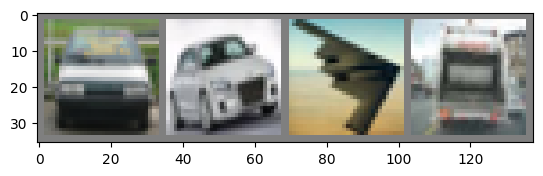

GroundTruth:    car   car plane truck


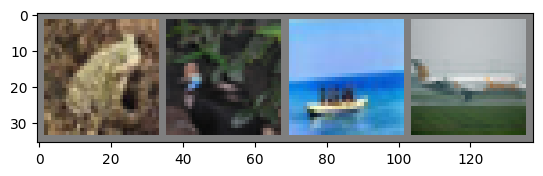

GroundTruth:   frog  bird  ship plane


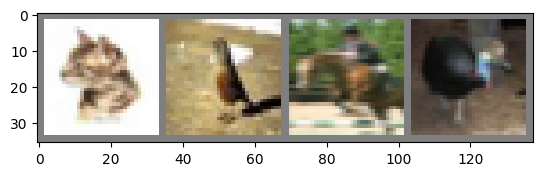

GroundTruth:    cat  bird horse  bird


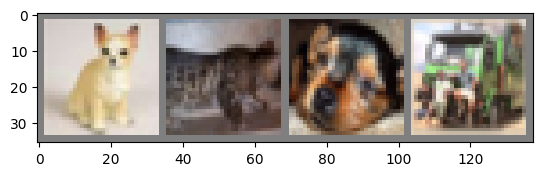

GroundTruth:    dog   cat   dog truck


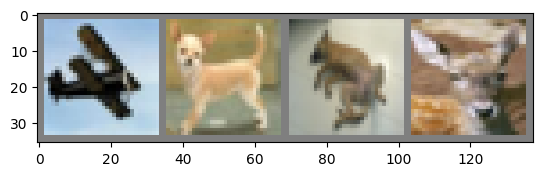

GroundTruth:  plane   dog   dog  deer


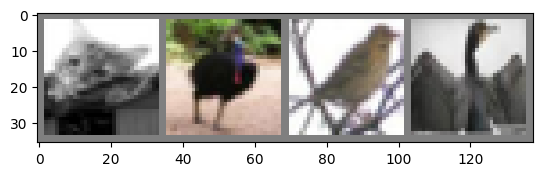

GroundTruth:    cat  bird  bird  bird


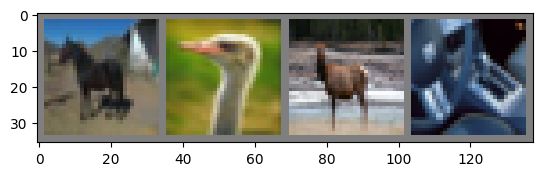

GroundTruth:  horse  bird  deer   car


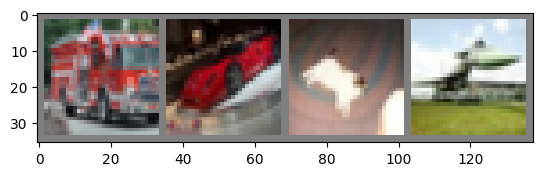

GroundTruth:  truck   car   cat plane


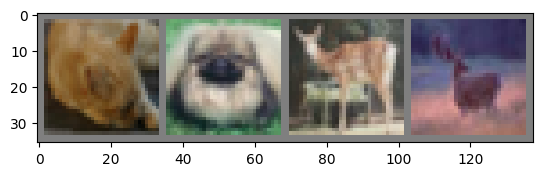

GroundTruth:    cat   dog  deer  deer


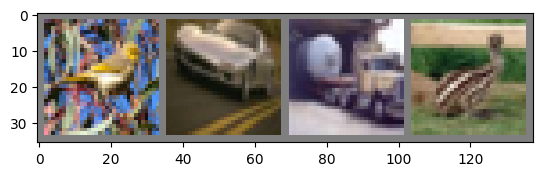

GroundTruth:   bird   car truck  bird


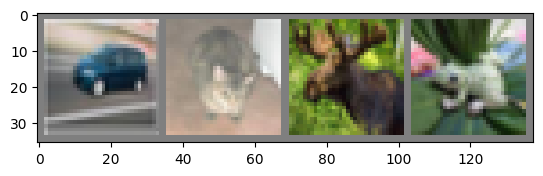

GroundTruth:    car   cat  deer  frog


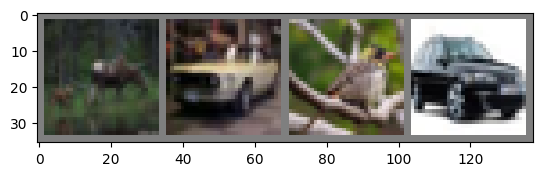

GroundTruth:   deer   car  bird   car


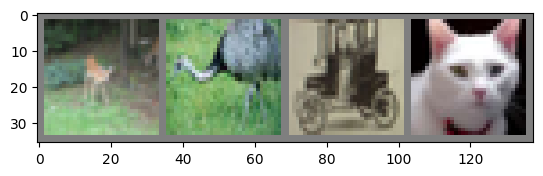

GroundTruth:   deer  bird   car   cat


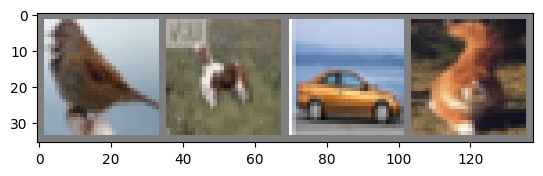

GroundTruth:   bird   dog   car   cat


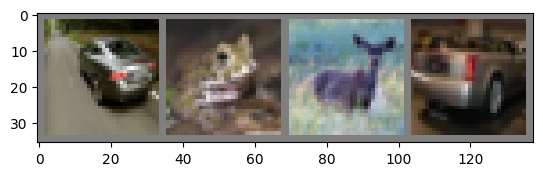

GroundTruth:    car  frog  deer   car


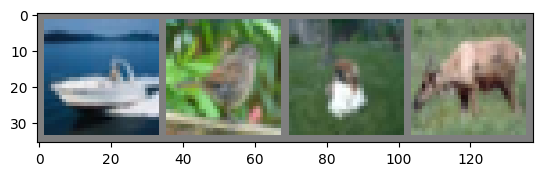

GroundTruth:   ship  bird   dog  deer


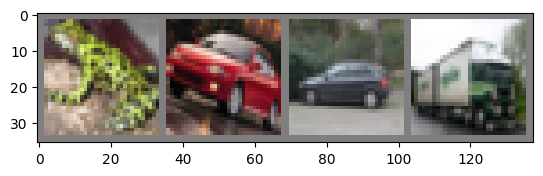

GroundTruth:   frog   car   car truck


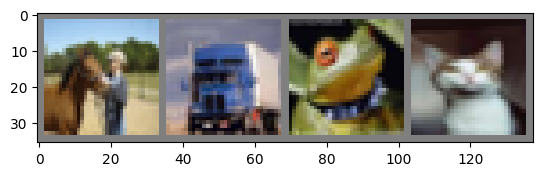

GroundTruth:  horse truck  frog   cat


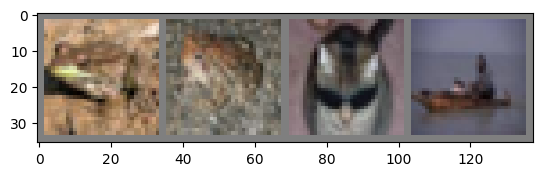

GroundTruth:   frog  frog   cat  ship


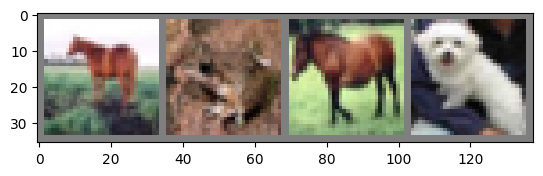

GroundTruth:  horse  frog horse   dog


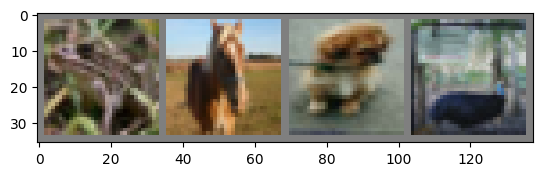

GroundTruth:   frog horse   dog  bird


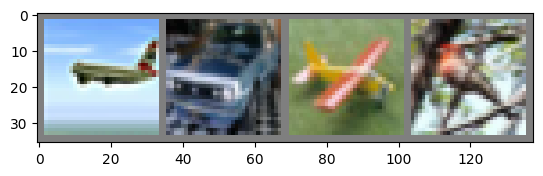

GroundTruth:  plane   car plane  bird


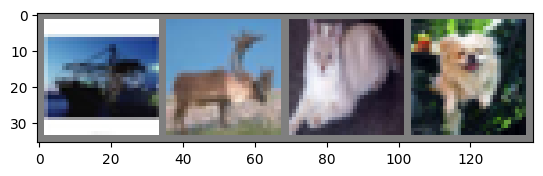

GroundTruth:   ship  deer   cat   dog


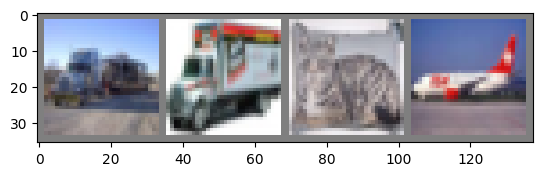

GroundTruth:  truck truck   cat plane


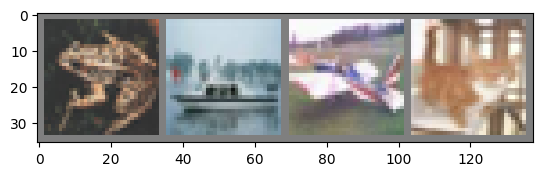

GroundTruth:   frog  ship plane   cat


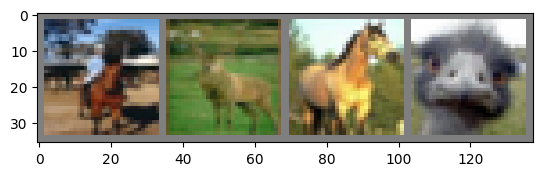

GroundTruth:  horse  deer horse  bird


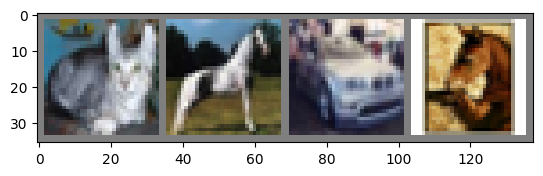

GroundTruth:    cat horse   car horse


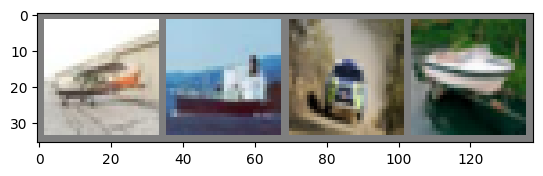

GroundTruth:  plane  ship   car  ship


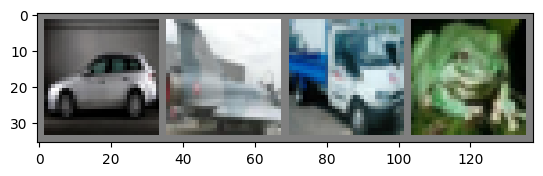

GroundTruth:    car plane truck  frog


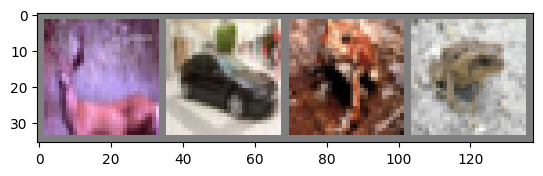

GroundTruth:   deer   car  frog  frog


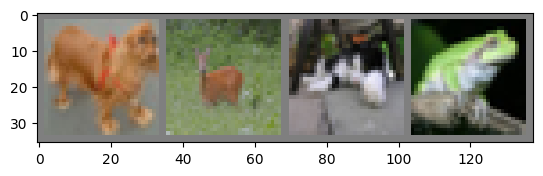

GroundTruth:    dog  deer   cat  frog


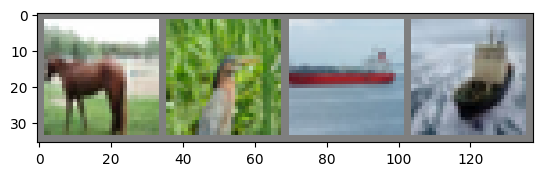

GroundTruth:  horse  bird  ship  ship


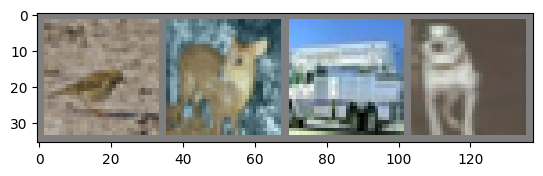

GroundTruth:   bird  deer truck   dog


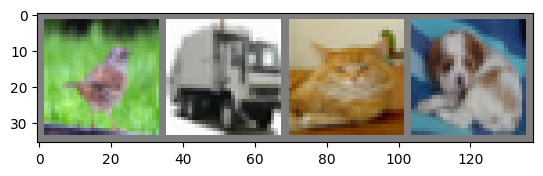

GroundTruth:   bird truck   cat   dog


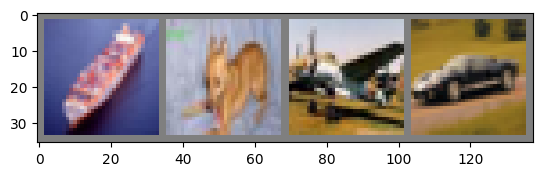

GroundTruth:   ship   dog plane   car


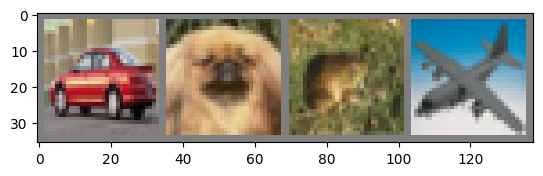

GroundTruth:    car   dog  frog plane


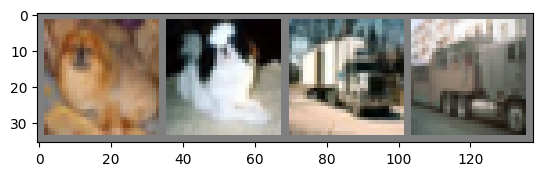

GroundTruth:    dog   dog truck truck


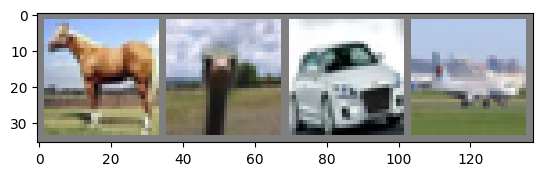

GroundTruth:  horse  bird   car plane


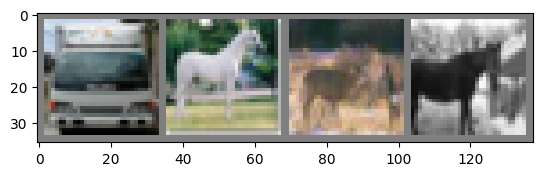

GroundTruth:  truck horse  deer horse


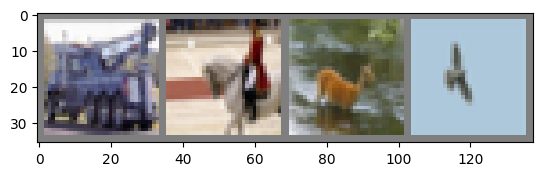

GroundTruth:  truck horse  deer  bird


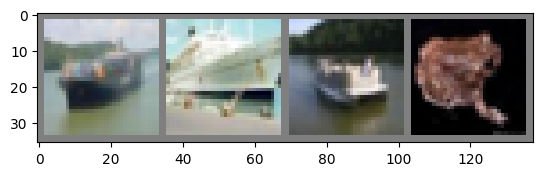

GroundTruth:   ship  ship  ship  frog


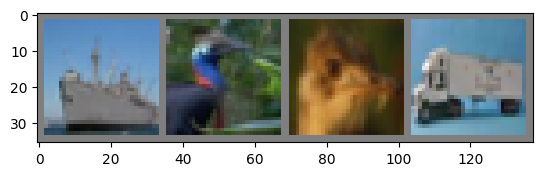

GroundTruth:   ship  bird  bird truck


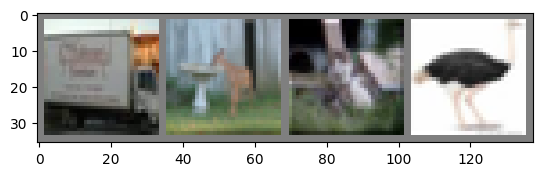

GroundTruth:  truck  deer   cat  bird


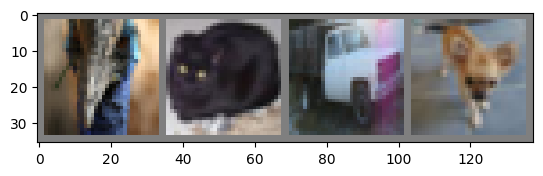

GroundTruth:   bird   cat truck   dog


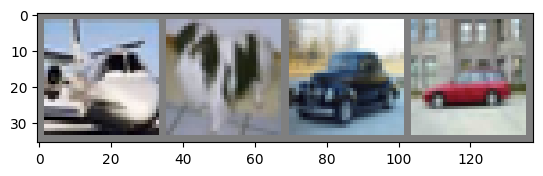

GroundTruth:  plane   dog   car   car


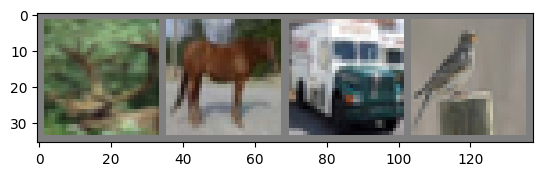

GroundTruth:   deer horse truck  bird


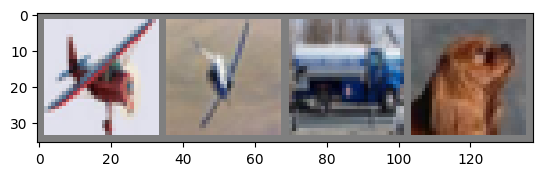

GroundTruth:  plane plane truck   dog


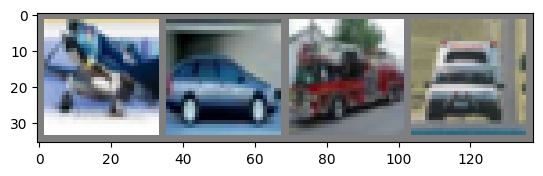

GroundTruth:  plane   car truck   car


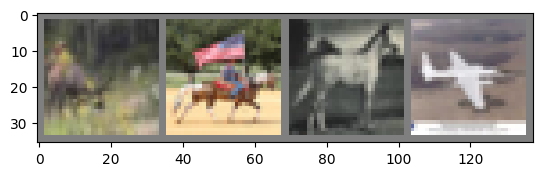

GroundTruth:   deer horse horse plane


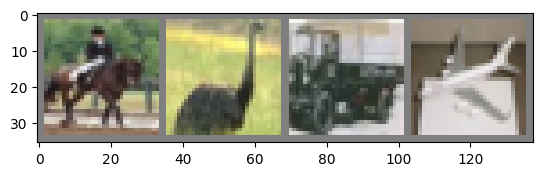

GroundTruth:  horse  bird truck plane


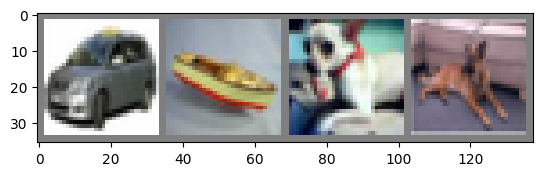

GroundTruth:    car  ship   dog   dog


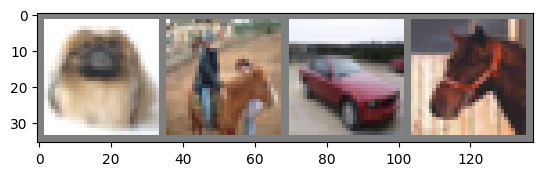

GroundTruth:    dog horse   car horse


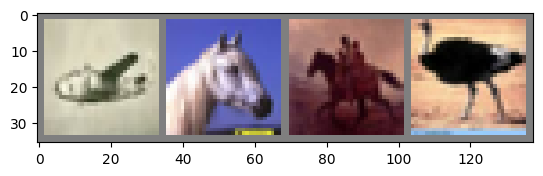

GroundTruth:  plane horse horse  bird


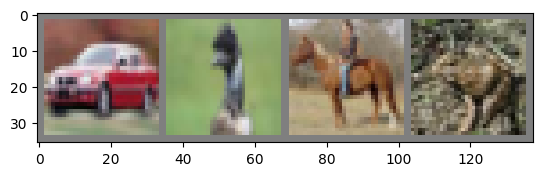

GroundTruth:    car  bird horse  frog


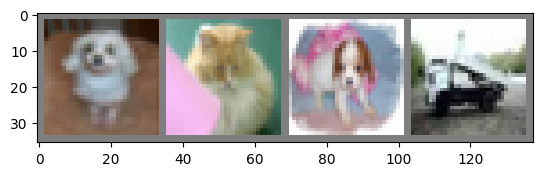

GroundTruth:    dog   cat   dog truck


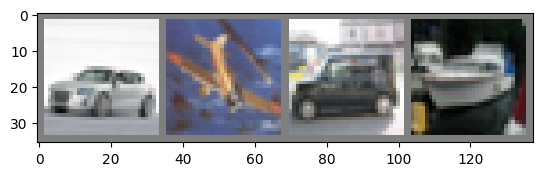

GroundTruth:    car plane   car  ship


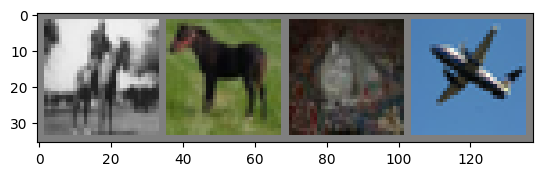

GroundTruth:  horse horse   cat plane


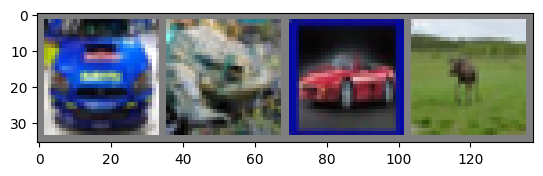

GroundTruth:    car  frog   car  deer


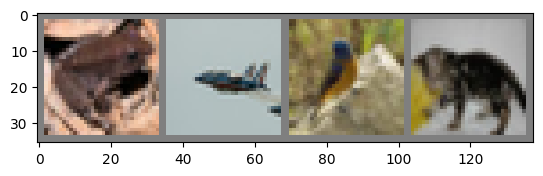

GroundTruth:   frog plane  bird   cat


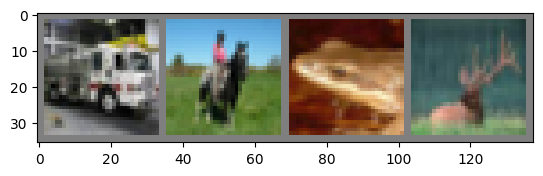

GroundTruth:  truck horse  frog  deer


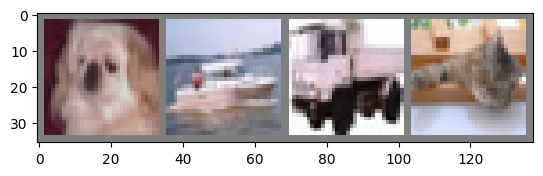

GroundTruth:    dog  ship truck   cat


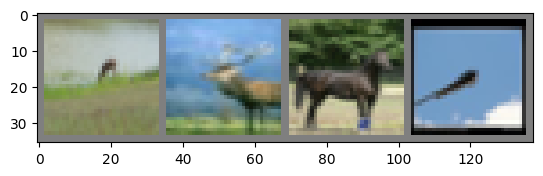

GroundTruth:   deer  deer horse plane


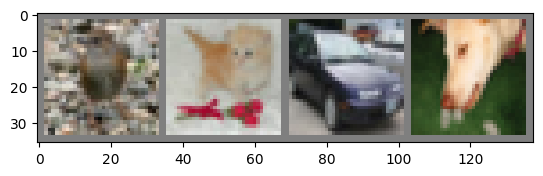

GroundTruth:   bird   cat   car   dog


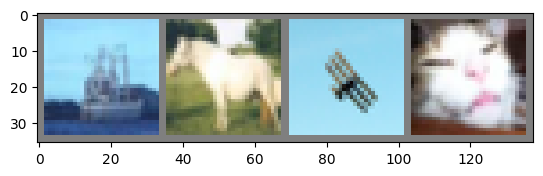

GroundTruth:   ship horse plane   cat


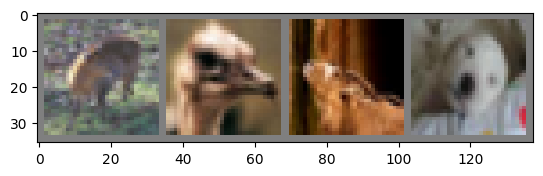

GroundTruth:   deer  bird  deer   dog


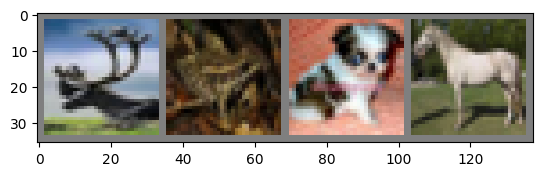

GroundTruth:   deer  frog   dog horse


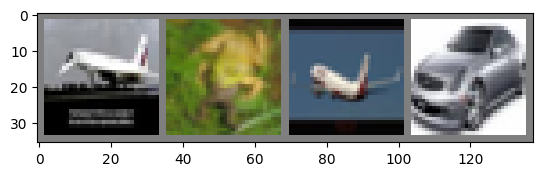

GroundTruth:  plane  frog plane   car


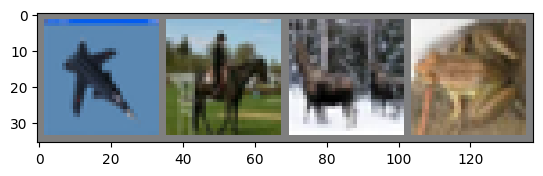

GroundTruth:  plane horse  deer  frog


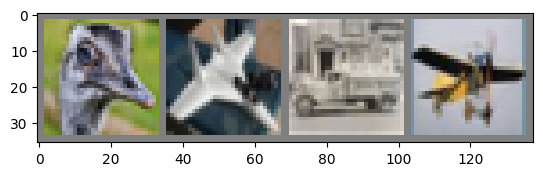

GroundTruth:   bird plane truck plane


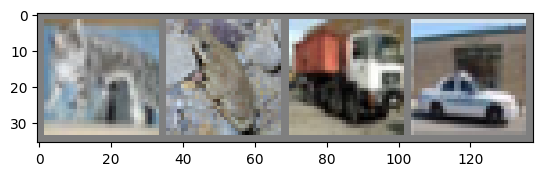

GroundTruth:    cat  frog truck   car


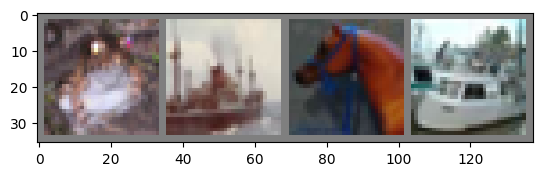

GroundTruth:   frog  ship horse  ship


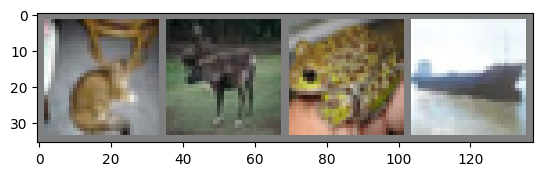

GroundTruth:    cat  deer  frog  ship


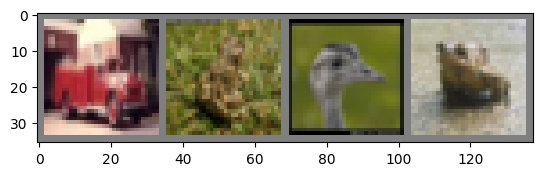

GroundTruth:  truck  frog  bird  frog


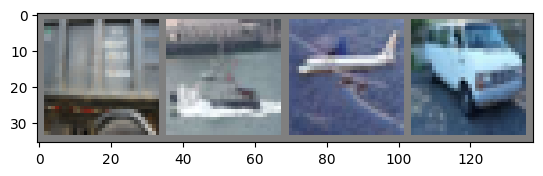

GroundTruth:  truck  ship plane   car


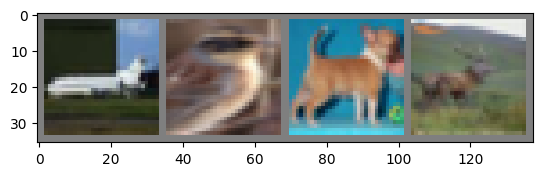

GroundTruth:  plane  bird   dog  deer


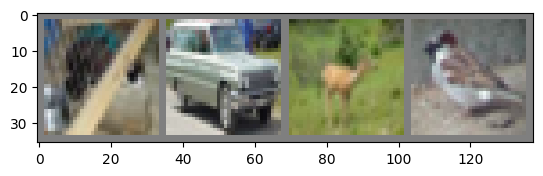

GroundTruth:    cat   car  deer  bird


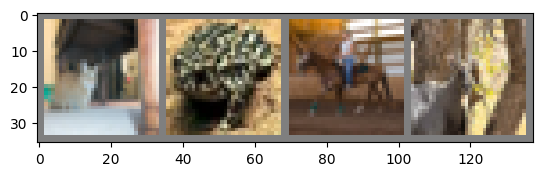

GroundTruth:    cat  frog horse  deer


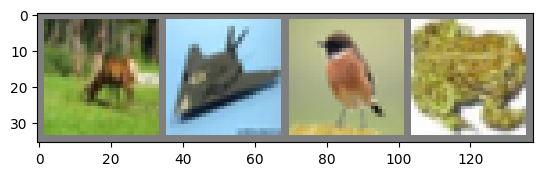

GroundTruth:   deer plane  bird  frog


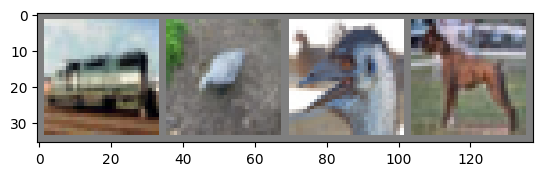

GroundTruth:  truck  bird  bird   dog


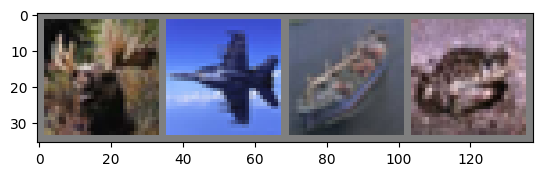

GroundTruth:   deer plane  ship  frog


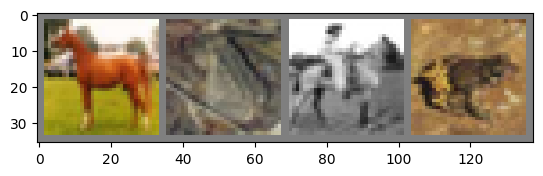

GroundTruth:  horse  frog horse  frog


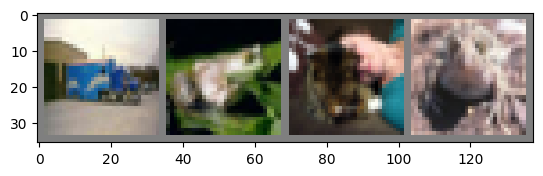

GroundTruth:  truck  frog   cat  frog


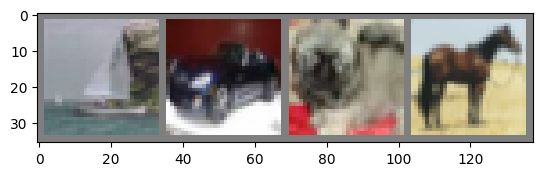

GroundTruth:   ship   car   dog horse


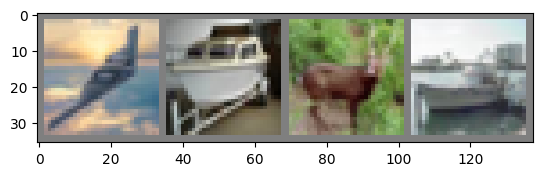

GroundTruth:  plane  ship  deer  ship


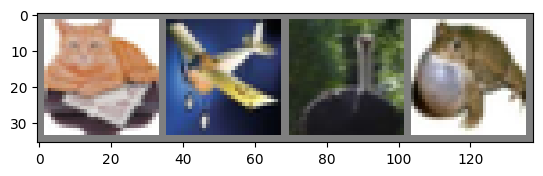

GroundTruth:    cat plane  bird  frog


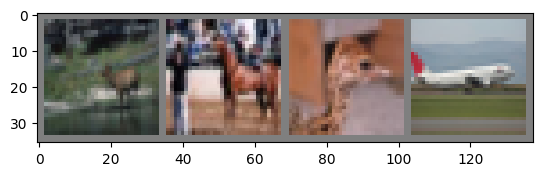

GroundTruth:   deer horse  bird plane


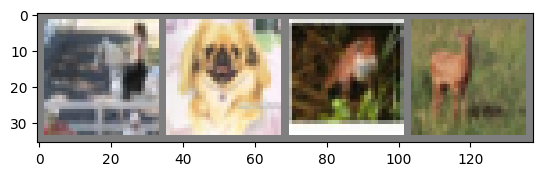

GroundTruth:  horse   dog  frog  deer


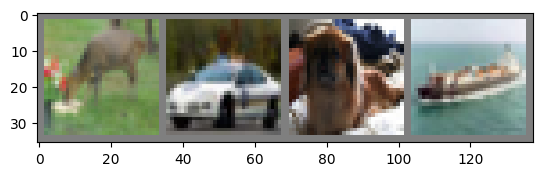

GroundTruth:   deer   car   dog  ship


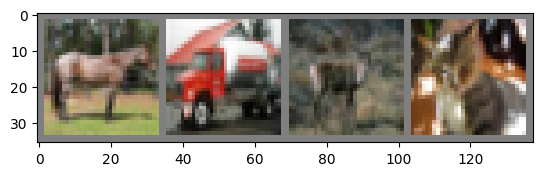

GroundTruth:  horse truck  deer   cat


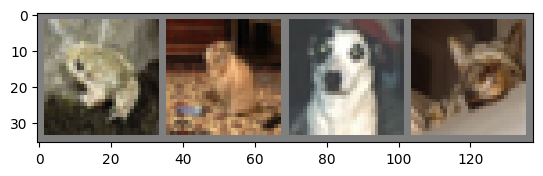

GroundTruth:   frog   cat   dog   cat


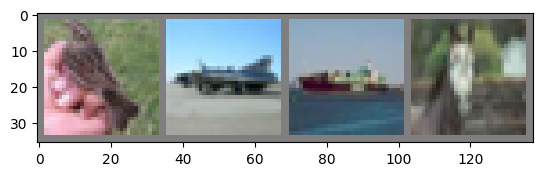

GroundTruth:   bird plane  ship horse


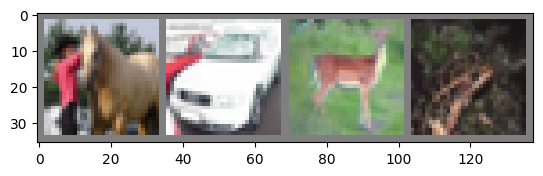

GroundTruth:  horse   car  deer  frog


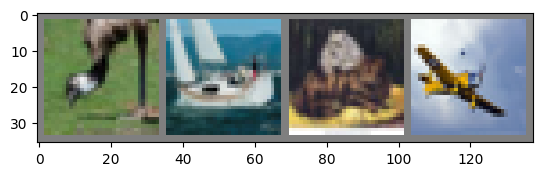

GroundTruth:   bird  ship   cat plane


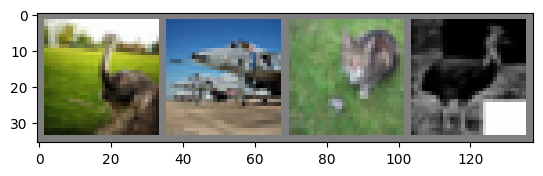

GroundTruth:   bird plane   cat  bird


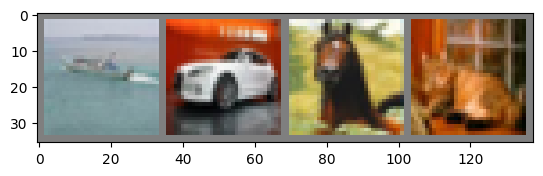

GroundTruth:   ship   car horse   cat


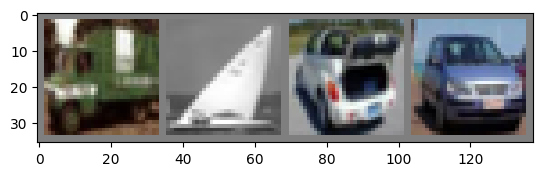

GroundTruth:  truck  ship   car   car


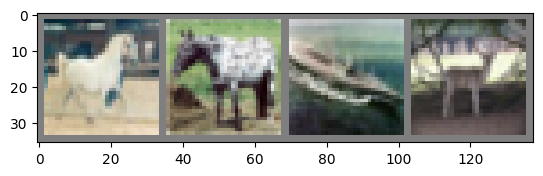

GroundTruth:  horse horse  ship  deer


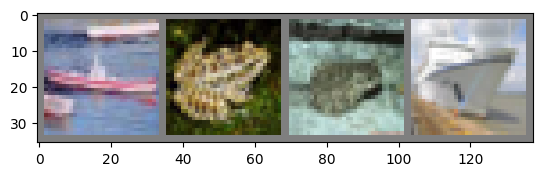

GroundTruth:   ship  frog  frog  ship


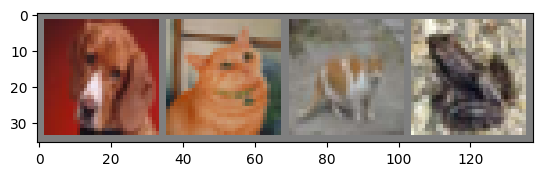

GroundTruth:    dog   cat   cat  frog


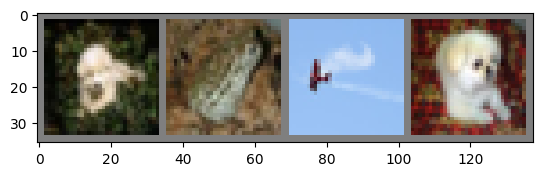

GroundTruth:    dog  frog plane   dog


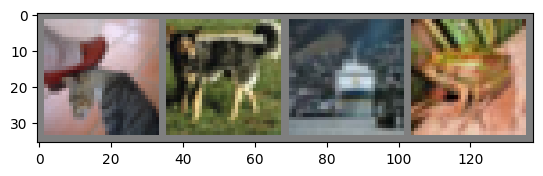

GroundTruth:    cat   dog  ship  frog


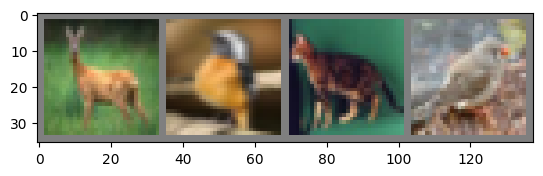

GroundTruth:   deer  bird   cat  bird


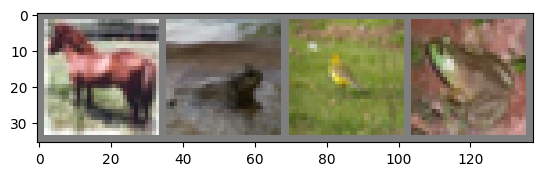

GroundTruth:  horse  frog  bird  frog


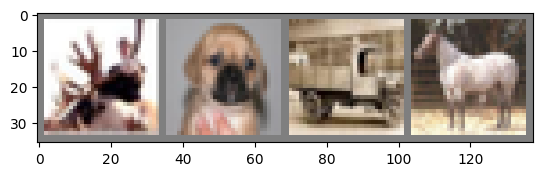

GroundTruth:   deer   dog truck horse


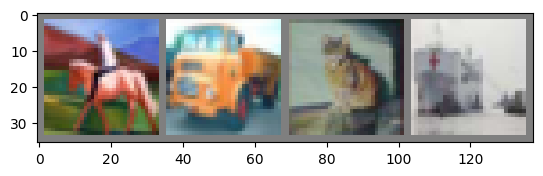

GroundTruth:  horse truck   cat  ship


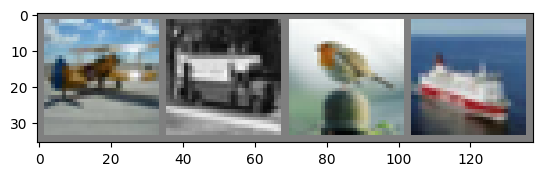

GroundTruth:  plane truck  bird  ship


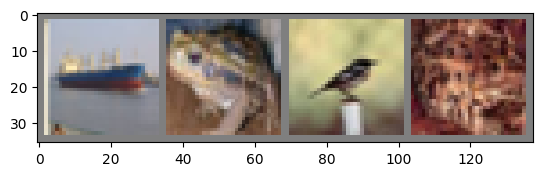

GroundTruth:   ship  frog  bird  frog


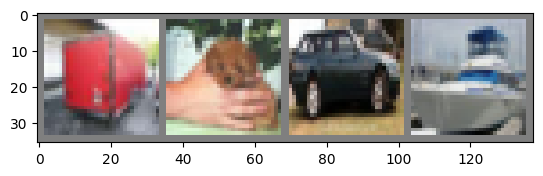

GroundTruth:  truck   dog   car  ship


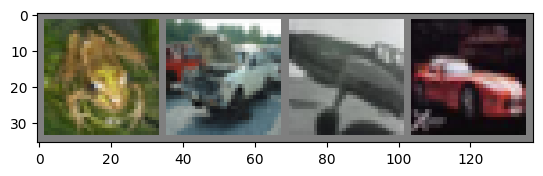

GroundTruth:   frog   car plane   car


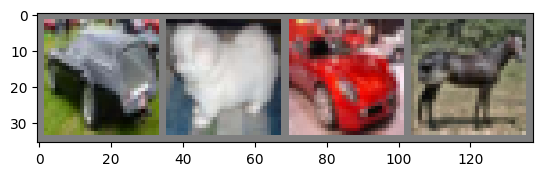

GroundTruth:    car   dog   car horse


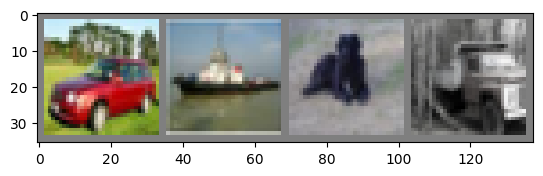

GroundTruth:    car  ship   dog truck


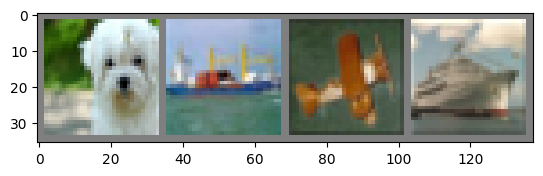

GroundTruth:    dog  ship plane  ship


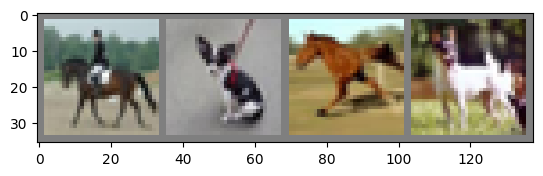

GroundTruth:  horse   dog horse   dog


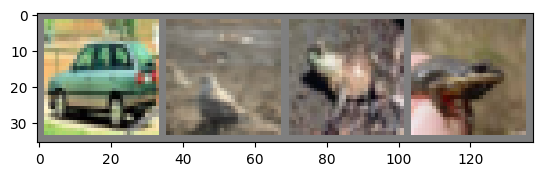

GroundTruth:    car  bird  frog  frog


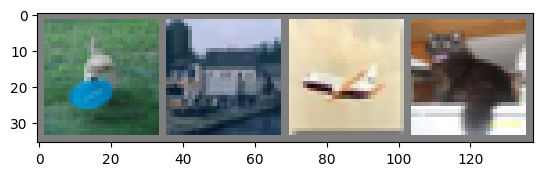

GroundTruth:    dog truck plane   cat


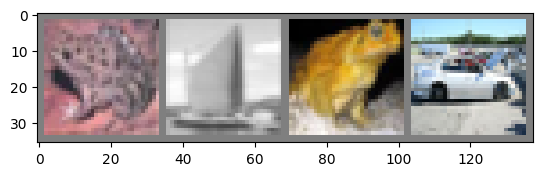

GroundTruth:   frog  ship  frog   car


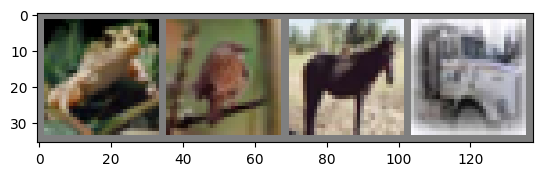

GroundTruth:   frog  bird horse truck


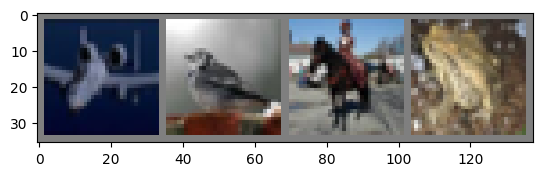

GroundTruth:  plane  bird horse  frog


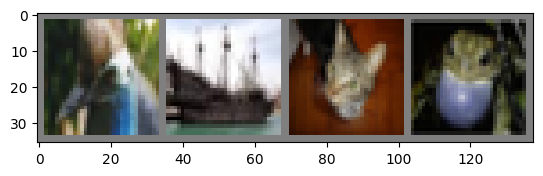

GroundTruth:   bird  ship   cat  frog


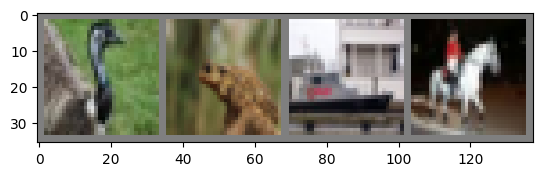

GroundTruth:   bird  frog  ship horse


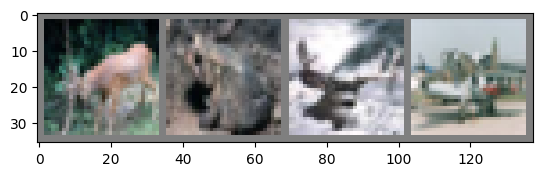

GroundTruth:   deer  frog  deer plane


KeyboardInterrupt: 

In [ ]:
# See `here <https://pytorch.org/docs/stable/notes/serialization.html>`_
# for more details on saving PyTorch models.
#
# 5. Test the network on the test data
# ^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^^
#
# We have trained the network for 2 passes over the training dataset.
# But we need to check if the network has learnt anything at all.
#
# We will check this by predicting the class label that the neural network
# outputs, and checking it against the ground-truth. If the prediction is
# correct, we add the sample to the list of correct predictions.
#
# Okay, first step. Let us display an image from the test set to get familiar.

# dataiter = iter(testloader)
# images, labels = dataiter.next()

for images, labels in trainloader:
    # print images
    imshow(torchvision.utils.make_grid(images))
    print('GroundTruth: ', ' '.join('%5s' % classes[labels[j]] for j in range(4)))

In [59]:
# Next, let's load back in our saved model (note: saving and re-loading the model


net = Net()
net.load_state_dict(torch.load(PATH))

<All keys matched successfully>

In [60]:
########################################################################
# Okay, now let us see what the neural network thinks these examples above are:

outputs = net(images)

In [61]:
########################################################################
# The outputs are energies for the 10 classes.
# The higher the energy for a class, the more the network
# thinks that the image is of the particular class.
# So, let's get the index of the highest energy:
_, predicted = torch.max(outputs, 1)

print('Predicted: ', ' '.join('%5s' % classes[predicted[j]]
                              for j in range(4)))

Predicted:   frog  ship plane  ship


In [62]:
########################################################################

#
# Let us look at how the network performs on the whole dataset.

correct = 0
total = 0
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs.data, 1)
        total += labels.size(0)
        correct += (predicted == labels).sum().item()

print('Accuracy of the network on the 10000 test images: %d %%' % (
    100 * correct / total))

Accuracy of the network on the 10000 test images: 51 %


In [63]:
########################################################################
# better than chance, which is 10% accuracy (randomly picking
# a class out of 10 classes).
# Seems like the network learnt something.
#
#  what are the classes that performed well, and the classes that did
# not perform well????? :

class_correct = list(0. for i in range(10))
class_total = list(0. for i in range(10))
with torch.no_grad():
    for data in testloader:
        images, labels = data
        outputs = net(images)
        _, predicted = torch.max(outputs, 1)
        c = (predicted == labels).squeeze()
        for i in range(4):
            label = labels[i]
            class_correct[label] += c[i].item()
            class_total[label] += 1


for i in range(10):
    print('Accuracy of %5s : %2d %%' % (
        classes[i], 100 * class_correct[i] / class_total[i]))

Accuracy of plane : 36 %
Accuracy of   car : 71 %
Accuracy of  bird : 35 %
Accuracy of   cat : 29 %
Accuracy of  deer : 63 %
Accuracy of   dog : 52 %
Accuracy of  frog : 70 %
Accuracy of horse : 43 %
Accuracy of  ship : 79 %
Accuracy of truck : 35 %
